# Image Classification into 6 Categories using Deep Learning

## Domain Analysis

Image classification is a computer vision task in which images are assigned to predefined categories based on their visual characteristics. Deep learning models, particularly Convolutional Neural Networks (CNNs), are well suited for learning meaningful visual patterns directly from image data.

This project belongs to the domains of **Artificial Intelligence, Deep Learning, and Computer Vision**.

## Business Case

Develop a machine learning model capable of classifying images into six predefined categories.

## Dataset Overview

The dataset consists of images along with their corresponding class labels for a six-category image classification task.

The dataset contains:
- **14,034 images**
- **6 predefined classes**
- `image_name` – identifies each image
- `label` – represents the corresponding image class

The images and labels will be analyzed to understand the class distribution, image dimensions, image format, and other relevant characteristics before model development.

In [1]:
# Import Required Libraries
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import warnings
warnings.filterwarnings("ignore")

In [2]:
# Define Dataset Path

dataset_path = r"D:\Data\images"

## Data Understanding

In [3]:
# Check Dataset Contents

os.listdir(dataset_path)

['images']

In [4]:
# Check Image Folder Contents

image_path = os.path.join(dataset_path, "images")

os.listdir(image_path)[:10]

['0.jpg',
 '1.jpg',
 '10.jpg',
 '100.jpg',
 '1000.jpg',
 '10000.jpg',
 '10001.jpg',
 '10002.jpg',
 '10003.jpg',
 '10006.jpg']

In [5]:
# Load Image Labels

csv_path = r"D:\Data\images.csv"

df = pd.read_csv(csv_path)

# Display the first five rows
df.head()

,image_name,label
0,0.jpg,0
1,1.jpg,4
2,2.jpg,5
3,4.jpg,0
4,7.jpg,4


#### Each image is mapped to a predefined class through the `label` column. Since the image filename does not indicate the class, the labels must be used as the target variable for model training.

In [6]:
# Inspect Dataset Structure

print("Dataset Shape:", df.shape)

print("\nColumn Names:")
print(df.columns.tolist())

print("\nData Types:")
print(df.dtypes)

Dataset Shape: (14034, 2)

Column Names:
['image_name', 'label']

Data Types:
image_name    object
label          int64
dtype: object


#### The dataset contains 14,034 records and 2 columns, representing the image filenames and their corresponding class labels.

In [7]:
# Check Unique Target Classes

print("Unique Labels:", sorted(df["label"].unique()))
print("Number of Classes:", df["label"].nunique())

Unique Labels: [np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5)]
Number of Classes: 6


#### The dataset contains six distinct classes, represented by labels 0 to 5, confirming that this is a **multiclass image classification** problem.

In [8]:
# Check Class Distribution

class_counts = df["label"].value_counts().sort_index()

print(class_counts)

label
0    2191
1    2271
2    2404
3    2512
4    2274
5    2382
Name: count, dtype: int64


## Visualize Class Distribution

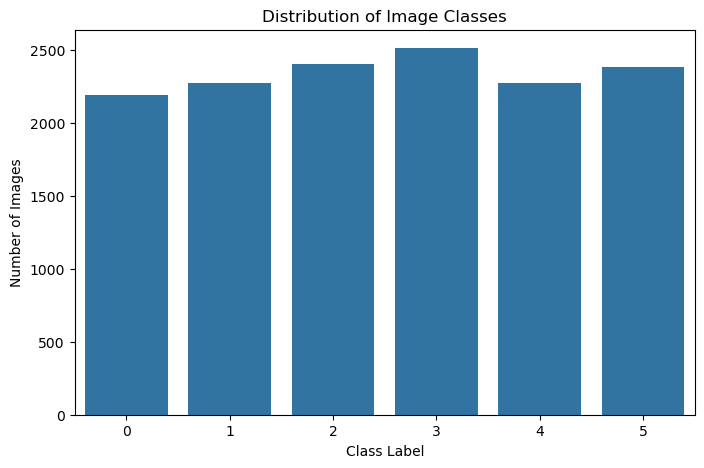

In [9]:
# Visualize Class Distribution

plt.figure(figsize=(8, 5))

sns.countplot(data=df, x="label")

plt.title("Distribution of Image Classes")
plt.xlabel("Class Label")
plt.ylabel("Number of Images")
plt.show()

#### The six classes have relatively similar sample counts, indicating a reasonably balanced dataset; therefore, no specific class-imbalance treatment is required at this stage.

In [10]:
# Calculate Class-wise Percentage Distribution

class_percentage = (class_counts / len(df) * 100).round(2)

print(class_percentage)

label
0    15.61
1    16.18
2    17.13
3    17.90
4    16.20
5    16.97
Name: count, dtype: float64


#### Each class represents approximately 16–18% of the dataset, confirming a reasonably balanced class distribution.

In [12]:
# Check for Missing Values

df.isnull().sum()

image_name    0
label         0
dtype: int64

#### Both `image_name` and `label` contain no missing values, so the dataset is complete and requires no missing-value treatment.

In [13]:
# Check for Duplicate Records

print("Number of Duplicate Records:", df.duplicated().sum())

Number of Duplicate Records: 0


#### The dataset contains no duplicate records, ensuring that each image-label mapping is unique.

In [11]:
# Verify Image Files Against Labels

image_files = set(os.listdir(image_path))
label_files = set(df["image_name"])

print("Images in Folder:", len(image_files))
print("Images in Label File:", len(label_files))
print("Missing Image Files:", len(label_files - image_files))
print("Unlisted Image Files:", len(image_files - label_files))

Images in Folder: 14034
Images in Label File: 14034
Missing Image Files: 0
Unlisted Image Files: 0


#### All 14,034 image files have a corresponding label, with no missing or unlisted images, confirming that the image dataset and label file are completely aligned.

In [12]:
# Inspect Image Dimensions and Format

sample_images = df["image_name"].sample(5, random_state=42)

for image_name in sample_images:
    img = Image.open(os.path.join(image_path, image_name))
    print(f"{image_name} -> Size: {img.size}, Mode: {img.mode}")

502.jpg -> Size: (150, 150), Mode: RGB
19352.jpg -> Size: (150, 150), Mode: RGB
19730.jpg -> Size: (150, 150), Mode: RGB
15810.jpg -> Size: (150, 150), Mode: RGB
11679.jpg -> Size: (150, 150), Mode: RGB


## Check Image Dimensions Across the Entire Dataset

In [13]:
# Check image dimensions across the entire dataset

image_sizes = []

for image_name in df["image_name"]:
    img = Image.open(os.path.join(image_path, image_name))
    image_sizes.append(img.size)

unique_sizes = set(image_sizes)

print("Number of Unique Image Sizes:", len(unique_sizes))
print("Image Sizes:", unique_sizes)

Number of Unique Image Sizes: 31
Image Sizes: {(150, 136), (150, 81), (150, 145), (150, 142), (150, 105), (150, 102), (150, 108), (150, 111), (150, 120), (150, 123), (150, 135), (150, 141), (150, 144), (150, 150), (150, 147), (150, 110), (150, 113), (150, 119), (150, 131), (150, 76), (150, 134), (150, 140), (150, 143), (150, 146), (150, 149), (150, 100), (150, 97), (150, 103), (150, 115), (150, 124), (150, 133)}


#### The images have 31 different dimensions, with a fixed width of 150 pixels but varying heights; therefore, resizing is required to obtain a consistent input shape for model training.

## Display Sample Images

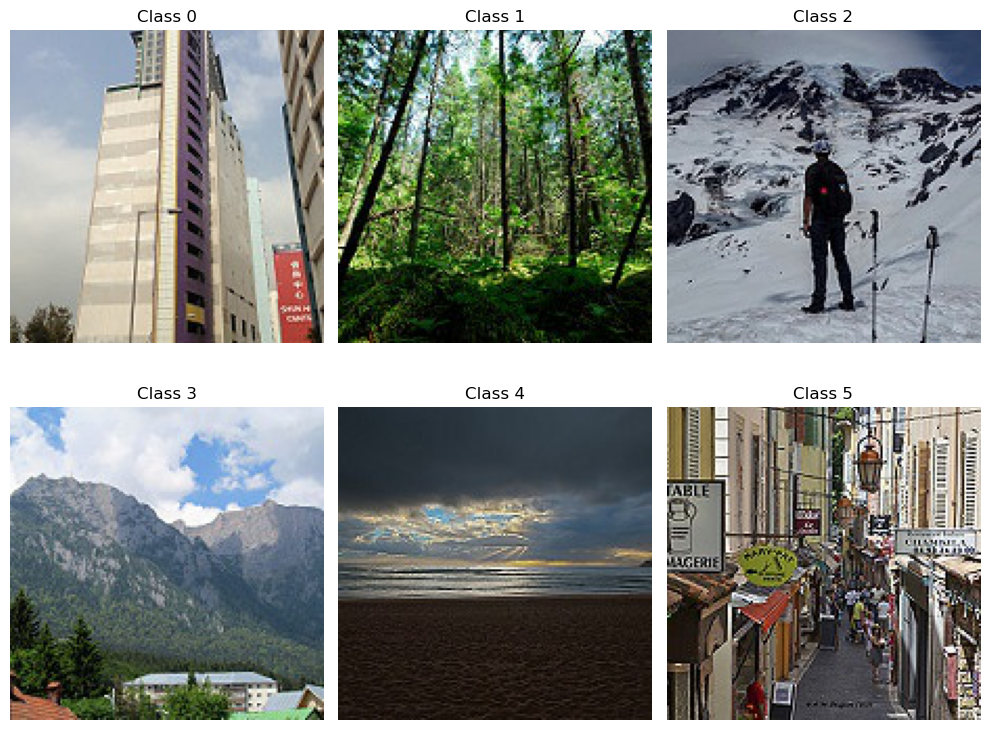

In [16]:
# Display Sample Image from Each Class

fig, axes = plt.subplots(2, 3, figsize=(10, 8))

for label, ax in zip(sorted(df["label"].unique()), axes.ravel()):
    image_name = df[df["label"] == label]["image_name"].sample(1, random_state=42).iloc[0]
    img = Image.open(os.path.join(image_path, image_name))
    
    ax.imshow(img)
    ax.set_title(f"Class {label}")
    ax.axis("off")

plt.tight_layout()
plt.show()

#### The sample images show visual variation across the six classes, highlighting the need for a model capable of learning meaningful visual features.

## Class-wise Image Inspection

To understand the visual characteristics of each class, multiple sample images from every class will be inspected. This helps in identifying the visual patterns associated with each label and understanding the nature of the multiclass classification problem.

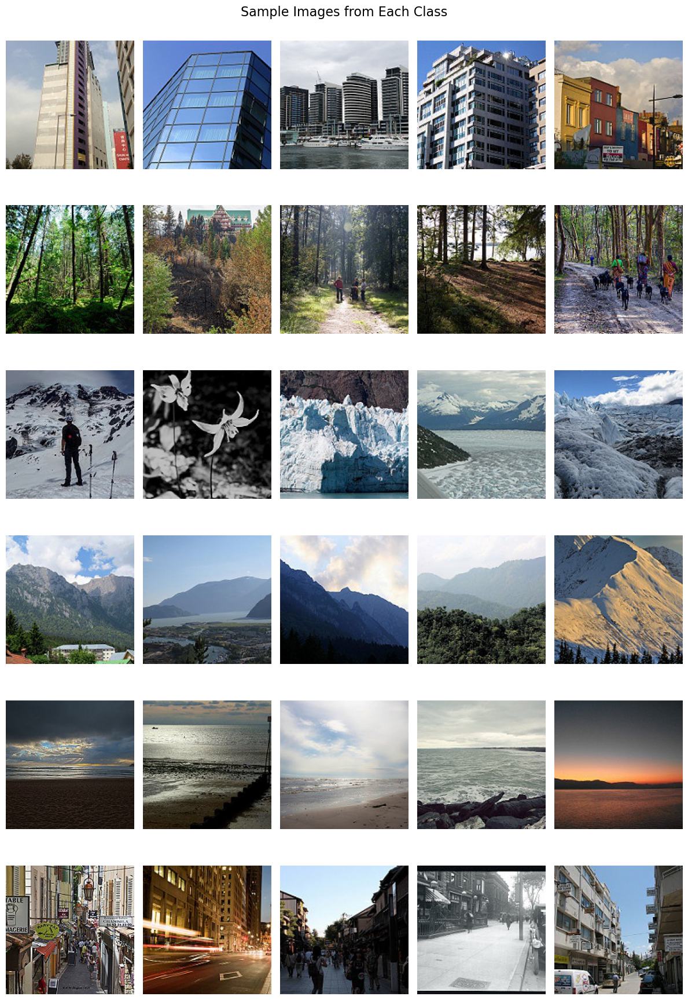

In [14]:
# Display Multiple Sample Images from Each Class

fig, axes = plt.subplots(6, 5, figsize=(12, 18))

for label in sorted(df["label"].unique()):
    
    # Select 5 random images from the current class
    sample_images = df[df["label"] == label].sample(5, random_state=42)
    
    for col, (_, row) in enumerate(sample_images.iterrows()):
        
        # Load image
        img_path = os.path.join(image_path, row["image_name"])
        img = Image.open(img_path)
        
        # Display image
        axes[label, col].imshow(img)
        axes[label, col].axis("off")
        
        # Add class label to the first image in each row
        if col == 0:
            axes[label, col].set_ylabel(
                f"Class {label}",
                fontsize=12
            )

plt.suptitle("Sample Images from Each Class", fontsize=16)
plt.tight_layout()
plt.show()

## Class Mapping

Based on the visual inspection of representative images from each class, the six labels can be interpreted as follows:

| Label | Category |
|------:|----------|
| 0 | Building |
| 1 | Forest |
| 2 | Glacier / Snow |
| 3 | Mountain |
| 4 | Sea / Coast |
| 5 | Street / Urban |

This mapping provides a meaningful interpretation of the numerical class labels and will be used when interpreting model predictions and evaluation results.

# Image Preprocessing

#### Image Resizing Strategy

- The original images in the dataset have varying dimensions. Therefore, all images will be resized to a fixed resolution of **128 × 128 pixels** during preprocessing. This ensures that every image has a uniform input shape, which is required for training a deep learning model. The selected resolution provides a balance between retaining relevant visual information and maintaining computational efficiency.

In [15]:
# Resize and Load Images

IMG_SIZE = (128, 128)

images = []
labels = []

for _, row in df.iterrows():
    
    # Construct Image File Path
    image_file = os.path.join(image_path, row["image_name"])
    
    # Open Image and Convert to RGB
    img = Image.open(image_file).convert("RGB")
    
    # Resize Image to Target Size
    img = img.resize(IMG_SIZE)
    
    # Convert Image to NumPy Array
    images.append(np.array(img))
    
    # Store Corresponding Label
    labels.append(row["label"])

# Convert Lists to NumPy Arrays
images = np.array(images)
labels = np.array(labels)

# Display Dataset Shapes
print("Images Shape:", images.shape)
print("Labels Shape:", labels.shape)

Images Shape: (14034, 128, 128, 3)
Labels Shape: (14034,)


#### After preprocessing, all 14,034 images have been resized to 128 × 128 pixels and represented using 3 RGB channels, with one corresponding label for each image.

## Image Normalization

Image normalization is the process of scaling pixel values to a standard numerical range so that the input data is suitable for efficient deep learning model training. The pixel values of the images range from **0 to 255**. To improve the training efficiency of the deep learning model, the pixel values will be normalized to the range of **0 to 1** by dividing each pixel value by 255.

In [16]:
# Normalize Image Pixel Values

images = images.astype("float32") / 255.0

In [17]:
# Check Normalized Pixel Value Range

print("Minimum Pixel Value:", images.min())
print("Maximum Pixel Value:", images.max())
print("Images Data Type:", images.dtype)

Minimum Pixel Value: 0.0
Maximum Pixel Value: 1.0
Images Data Type: float32


#### The pixel values were successfully normalized from the original range of 0–255 to 0–1, providing a consistent scale that helps improve the stability and efficiency of deep learning model training.

## Visualize Preprocessed Images

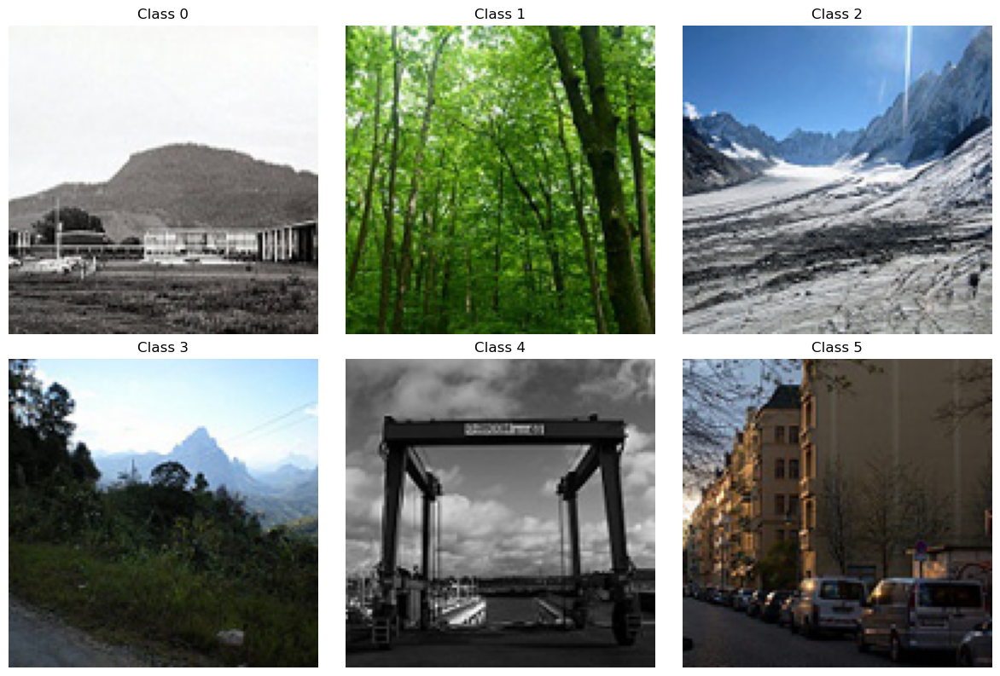

In [21]:
# Visualize Preprocessed Images

fig, axes = plt.subplots(2, 3, figsize=(12, 8))

for label, ax in zip(sorted(df["label"].unique()), axes.ravel()):
    sample_index = df.index[df["label"] == label][0]
    
    ax.imshow(images[sample_index])
    ax.set_title(f"Class {label}")
    ax.axis("off")

plt.tight_layout()
plt.show()

## Train-Test Split

The dataset will be divided into training and testing sets using an **80:20 ratio**. Stratified splitting will be used to maintain a similar distribution of all six classes in both the training and testing datasets.

In [18]:
# Import Train-Test Split Function

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=0.20, random_state=42, stratify=labels)

In [19]:
# Display Dataset Shapes

print("X_train Shape:", X_train.shape)
print("X_test Shape:", X_test.shape)

print("\ny_train Shape:", y_train.shape)
print("y_test Shape:", y_test.shape)

X_train Shape: (11227, 128, 128, 3)
X_test Shape: (2807, 128, 128, 3)

y_train Shape: (11227,)
y_test Shape: (2807,)


#### The dataset was split into 11,227 training images and 2,807 testing images using an 80:20 ratio, while retaining the standardized 128 × 128 RGB image format.

## Verify Class Distribution After Train-Test Split

In [20]:
# Verify Class Distribution After Train-Test Split

print("Training Data:")
print(pd.Series(y_train).value_counts().sort_index())

print("\nTesting Data:")
print(pd.Series(y_test).value_counts().sort_index())

Training Data:
0    1753
1    1817
2    1923
3    2009
4    1819
5    1906
Name: count, dtype: int64

Testing Data:
0    438
1    454
2    481
3    503
4    455
5    476
Name: count, dtype: int64


# Model Building

# Artificial Neural Network (ANN)

An **Artificial Neural Network (ANN)** is a deep learning model that learns patterns from input data using interconnected layers of neurons. For image classification, the images are flattened into a one-dimensional feature vector before being provided to the ANN.

In [48]:
# Flatten Training Images for ANN

X_train_ann = X_train.reshape(X_train.shape[0], -1)

# Flatten Testing Images for ANN

X_test_ann = X_test.reshape(X_test.shape[0], -1)

# Display ANN Input Shapes

print("X_train_ann Shape:", X_train_ann.shape)
print("X_test_ann Shape:", X_test_ann.shape)

X_train_ann Shape: (11227, 49152)
X_test_ann Shape: (2807, 49152)


#### The images were flattened into a one-dimensional feature vector containing 49,152 features for each image, making them suitable as input to the ANN.

In [49]:
# Import Required Libraries
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout

# Build ANN Model
ann_model = Sequential()

# Input Layer and First Hidden Layer
ann_model.add(Dense(256, activation="relu", input_shape=(49152,)))
ann_model.add(Dropout(0.3))

# Second Hidden Layer
ann_model.add(Dense(128, activation="relu"))
ann_model.add(Dropout(0.3))

# Third Hidden Layer
ann_model.add(Dense(64, activation="relu"))

# Output Layer for 6-Class Classification
ann_model.add(Dense(6, activation="softmax"))

# Display Model Architecture
ann_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 256)            │    12,583,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 6)              │           390 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 12,624,710 (48.16 MB)

 Trainable params: 12,624,710 (48.16 MB)

 Non-trainable params: 0 (0.00 B)

In [50]:
# Compile ANN Model

ann_model.compile(
    optimizer="adam",                           # Optimizer for updating model weights
    loss="sparse_categorical_crossentropy",     # Loss function for integer class labels
    metrics=["accuracy"]                        # Evaluation metric for classification accuracy
)

In [51]:
# Import Model Checkpoint Callback
from tensorflow.keras.callbacks import ModelCheckpoint

# Define Model Checkpoint
ann_checkpoint = ModelCheckpoint(
    "best_ann_model.keras",       # File name for the best ANN model
    monitor="val_loss",           # Monitor validation loss
    save_best_only=True,          # Save only when validation loss improves
    mode="min",                   # Lower validation loss is better
    verbose=1                     # Display when the model is saved
)

In [52]:
# Train ANN Model with Model Checkpoint

ann_history = ann_model.fit(
    X_train_ann,                  # Flattened training images
    y_train,                      # Training labels
    epochs=20,                    # Number of training iterations
    batch_size=32,                # Number of samples processed per update
    validation_split=0.2,         # Use 20% of training data for validation
    callbacks=[ann_checkpoint],   # Save the best model during training
    verbose=1                     # Display training progress
)

Epoch 1/20
281/281 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step - accuracy: 0.2213 - loss: 4.9299
Epoch 1: val_loss improved from None to 1.58336, saving model to best_ann_model.keras

Epoch 1: finished saving model to best_ann_model.keras
281/281 ━━━━━━━━━━━━━━━━━━━━ 62s 200ms/step - accuracy: 0.2548 - loss: 2.6009 - val_accuracy: 0.3362 - val_loss: 1.5834
Epoch 2/20
281/281 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step - accuracy: 0.2727 - loss: 1.6869
Epoch 2: val_loss improved from 1.58336 to 1.52345, saving model to best_ann_model.keras

Epoch 2: finished saving model to best_ann_model.keras
281/281 ━━━━━━━━━━━━━━━━━━━━ 52s 185ms/step - accuracy: 0.2919 - loss: 1.6572 - val_accuracy: 0.3798 - val_loss: 1.5235
Epoch 3/20
281/281 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step - accuracy: 0.2619 - loss: 1.6813
Epoch 3: val_loss did not improve from 1.52345
281/281 ━━━━━━━━━━━━━━━━━━━━ 52s 183ms/step - accuracy: 0.2714 - loss: 1.6706 - val_accuracy: 0.3695 - val_loss: 1.5399
Epoch 4/20
281/281 ━━━━━━━━━━━━━━━━━━━━ 0s

In [53]:
# Load the Best ANN Model

from tensorflow.keras.models import load_model

best_ann_model = load_model("best_ann_model.keras")

In [54]:
# Evaluate Best ANN Model on Test Data

ann_test_loss, ann_test_accuracy = best_ann_model.evaluate(
    X_test_ann,                  # Flattened test images
    y_test,                      # Test labels
    verbose=1                    # Display evaluation progress
)

# Display Test Performance

print("ANN Test Loss:", ann_test_loss)
print("ANN Test Accuracy:", ann_test_accuracy)

88/88 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - accuracy: 0.4289 - loss: 1.4259
ANN Test Loss: 1.4259060621261597
ANN Test Accuracy: 0.4289276897907257


In [55]:
# Generate Predictions Using the Best ANN Model

y_pred_prob = best_ann_model.predict(
    X_test_ann,                  # Flattened test images
    verbose=1                    # Display prediction progress
)

# Convert Probabilities to Predicted Class Labels
y_pred_ann = np.argmax(y_pred_prob, axis=1)

# Display First 10 Predictions
print("Predicted Labels:", y_pred_ann[:10])
print("Actual Labels:   ", y_test[:10])

88/88 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step
Predicted Labels: [5 2 2 5 0 2 2 2 2 5]
Actual Labels:    [1 2 3 0 0 3 4 4 4 5]


## ANN Classification Report

In [56]:
# Generate ANN Classification Report

from sklearn.metrics import classification_report

print(classification_report(
    y_test,
    y_pred_ann,
    target_names=[
        "Building",
        "Forest",
        "Glacier / Snow",
        "Mountain",
        "Sea / Coast",
        "Street / Urban"
    ]
))

                precision    recall  f1-score   support

      Building       0.23      0.11      0.14       438
        Forest       0.77      0.76      0.77       454
Glacier / Snow       0.31      0.80      0.45       481
      Mountain       0.43      0.15      0.22       503
   Sea / Coast       0.43      0.02      0.04       455
Street / Urban       0.48      0.72      0.57       476

      accuracy                           0.43      2807
     macro avg       0.44      0.43      0.37      2807
  weighted avg       0.44      0.43      0.37      2807



## Confusion Matrix

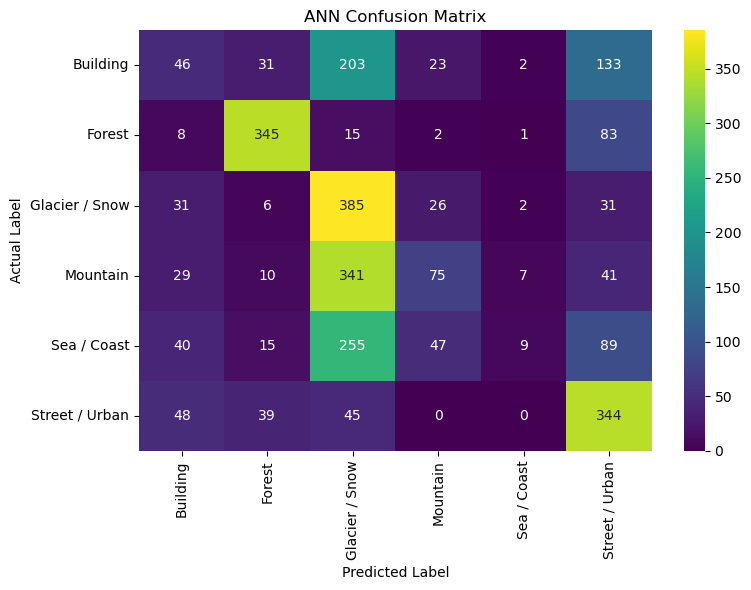

In [60]:
# Generate ANN Confusion Matrix

from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate Confusion Matrix
cm_ann = confusion_matrix(y_test, y_pred_ann)

# Plot Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(
    cm_ann,
    annot=True,
    fmt="d",
    cmap="viridis",
    xticklabels=["Building", "Forest", "Glacier / Snow", "Mountain", "Sea / Coast", "Street / Urban"],
    yticklabels=["Building", "Forest", "Glacier / Snow", "Mountain", "Sea / Coast", "Street / Urban"]
)

# Add Plot Labels
plt.title("ANN Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.tight_layout()
plt.show()

#### ANN Confusion Matrix Interpretation

The confusion matrix shows that the ANN classifies Forest, Glacier / Snow, and Street / Urban relatively better than the other classes. However, substantial misclassification is observed for Building, Mountain, and Sea / Coast, with many of these images being predicted as Glacier / Snow.

This indicates that the ANN struggles to capture the spatial and visual patterns needed to distinguish between different image categories. CNN-based models will therefore be explored to improve image classification performance.

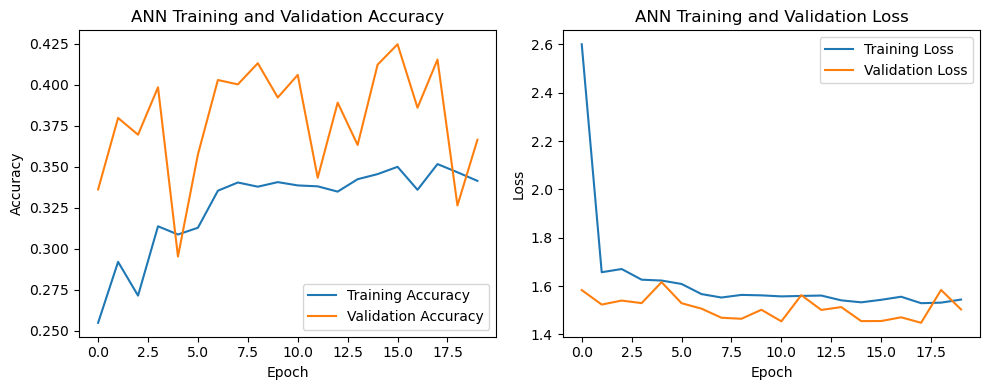

In [90]:
# Plot ANN Training and Validation Performance

plt.figure(figsize=(10, 4))

# Plot Accuracy
plt.subplot(1, 2, 1)
plt.plot(ann_history.history["accuracy"], label="Training Accuracy")
plt.plot(ann_history.history["val_accuracy"], label="Validation Accuracy")
plt.title("ANN Training and Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()

# Plot Loss
plt.subplot(1, 2, 2)
plt.plot(ann_history.history["loss"], label="Training Loss")
plt.plot(ann_history.history["val_loss"], label="Validation Loss")
plt.title("ANN Training and Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

plt.tight_layout()
plt.show()

### Insights

The ANN shows a **gradual reduction in training loss**, but the accuracy remains relatively low and the **validation accuracy fluctuates across epochs**. The validation loss also shows **limited improvement**, indicating that the ANN has limited ability to learn the visual patterns from flattened image pixels.

The learning curves do not show a clear pattern of **severe overfitting**. The results further support the use of a **CNN**, which can learn **spatial features and local patterns directly from the image structure**.

### ANN Model Conclusion

The ANN achieved a test accuracy of **42.89%** on the six-class image classification task. Although the model was able to learn some patterns from the images, its overall classification performance remained limited.

The learning curves also showed **low and fluctuating validation accuracy** with limited improvement in validation loss. Since the ANN uses flattened image pixels, it does not effectively capture the **spatial relationships and local visual features** present in images.

Therefore, the ANN serves as a **baseline model**, and a **CNN will be developed next** to learn spatial features more effectively and improve image classification performance.

# Convolutional Neural Network (CNN)

A **Convolutional Neural Network (CNN)** is a deep learning model designed for image data that automatically learns visual features such as edges, textures, and shapes.

CNNs preserve the **spatial structure of images**, making them highly suitable for image classification tasks.

In [74]:
# Import Required CNN Layers

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense

# Build Basic CNN Model

cnn_model = Sequential()

# First Convolutional Layer
cnn_model.add(Conv2D(32, (3, 3), activation="relu", input_shape=(128, 128, 3)))

# First Max Pooling Layer
cnn_model.add(MaxPooling2D((2, 2)))

# Second Convolutional Layer
cnn_model.add(Conv2D(64, (3, 3), activation="relu"))

# Second Max Pooling Layer
cnn_model.add(MaxPooling2D((2, 2)))

# Third Convolutional Layer
cnn_model.add(Conv2D(128, (3, 3), activation="relu"))

# Third Max Pooling Layer
cnn_model.add(MaxPooling2D((2, 2)))

# Flatten Feature Maps
cnn_model.add(Flatten())

# Fully Connected Layer
cnn_model.add(Dense(128, activation="relu"))

# Output Layer for 6-Class Classification
cnn_model.add(Dense(6, activation="softmax"))

# Display CNN Model Architecture
cnn_model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_6 (Conv2D)               │ (None, 126, 126, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 63, 63, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 61, 61, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 28, 28, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 14, 14, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 128)            │     3,211,392 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,305,414 (12.61 MB)

 Trainable params: 3,305,414 (12.61 MB)

 Non-trainable params: 0 (0.00 B)

In [75]:
# Compile CNN Model

cnn_model.compile(
    optimizer="adam",                    # Optimizer for updating model weights
    loss="sparse_categorical_crossentropy",  # Loss function for integer class labels
    metrics=["accuracy"]                 # Evaluation metric for classification accuracy
)

In [76]:
# Define CNN Model Checkpoint

cnn_checkpoint = ModelCheckpoint(
    "best_cnn_model.keras",          # File name for the best CNN model
    monitor="val_loss",              # Monitor validation loss
    save_best_only=True,             # Save only the best-performing model
    mode="min",                      # Lower validation loss is better
    verbose=1                        # Display when the model is saved
)

In [77]:
# Train CNN Model

cnn_history = cnn_model.fit(
    X_train,                     # Training images
    y_train,                     # Training labels
    epochs=20,                   # Number of training iterations
    batch_size=32,               # Number of samples processed per update
    validation_split=0.2,        # Use 20% of training data for validation
    callbacks=[cnn_checkpoint],  # Save the best CNN model
    verbose=1                    # Display training progress
)

Epoch 1/20
281/281 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step - accuracy: 0.4535 - loss: 1.3308
Epoch 1: val_loss improved from None to 0.91982, saving model to best_cnn_model.keras

Epoch 1: finished saving model to best_cnn_model.keras
281/281 ━━━━━━━━━━━━━━━━━━━━ 151s 514ms/step - accuracy: 0.5703 - loss: 1.0807 - val_accuracy: 0.6647 - val_loss: 0.9198
Epoch 2/20
281/281 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step - accuracy: 0.7024 - loss: 0.7783
Epoch 2: val_loss improved from 0.91982 to 0.71957, saving model to best_cnn_model.keras

Epoch 2: finished saving model to best_cnn_model.keras
281/281 ━━━━━━━━━━━━━━━━━━━━ 198s 500ms/step - accuracy: 0.7223 - loss: 0.7391 - val_accuracy: 0.7404 - val_loss: 0.7196
Epoch 3/20
281/281 ━━━━━━━━━━━━━━━━━━━━ 0s 795ms/step - accuracy: 0.7720 - loss: 0.6147
Epoch 3: val_loss improved from 0.71957 to 0.68966, saving model to best_cnn_model.keras

Epoch 3: finished saving model to best_cnn_model.keras
281/281 ━━━━━━━━━━━━━━━━━━━━ 233s 830ms/step - accuracy: 0.772

In [78]:
# Load the Best CNN Model

best_cnn_model = load_model("best_cnn_model.keras")

In [79]:
# Evaluate Best CNN Model on Test Data

cnn_test_loss, cnn_test_accuracy = best_cnn_model.evaluate(
    X_test,                       # Test images
    y_test,                       # Test labels
    verbose=1                     # Display evaluation progress
)

# Display Test Performance

print("CNN Test Loss:", cnn_test_loss)
print("CNN Test Accuracy:", cnn_test_accuracy)

88/88 ━━━━━━━━━━━━━━━━━━━━ 13s 135ms/step - accuracy: 0.7606 - loss: 0.6510
CNN Test Loss: 0.6510124802589417
CNN Test Accuracy: 0.7605984807014465


In [80]:
# Generate Predictions Using the Best CNN Model

y_pred_prob_cnn = best_cnn_model.predict(
    X_test,                      # Test images
    verbose=1                    # Display prediction progress
)

# Convert Probabilities to Predicted Class Labels
y_pred_cnn = np.argmax(y_pred_prob_cnn, axis=1)

# Display First 10 Predictions
print("Predicted Labels:", y_pred_cnn[:10])
print("Actual Labels:   ", y_test[:10])

88/88 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step
Predicted Labels: [1 2 3 0 5 4 4 4 4 5]
Actual Labels:    [1 2 3 0 0 3 4 4 4 5]


## Classification Report

In [81]:
# Generate CNN Classification Report

from sklearn.metrics import classification_report

print(classification_report(
    y_test,
    y_pred_cnn,
    target_names=[
        "Building",
        "Forest",
        "Glacier / Snow",
        "Mountain",
        "Sea / Coast",
        "Street / Urban"
    ]
))

                precision    recall  f1-score   support

      Building       0.81      0.68      0.74       438
        Forest       0.89      0.93      0.91       454
Glacier / Snow       0.70      0.76      0.73       481
      Mountain       0.84      0.54      0.66       503
   Sea / Coast       0.63      0.87      0.73       455
Street / Urban       0.78      0.81      0.80       476

      accuracy                           0.76      2807
     macro avg       0.77      0.76      0.76      2807
  weighted avg       0.77      0.76      0.76      2807



## Confusion Matrix

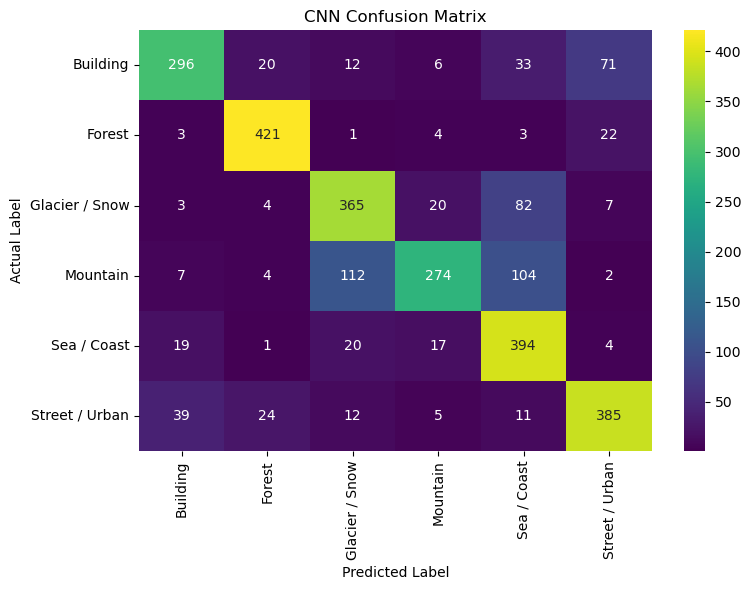

In [83]:
# Generate CNN Confusion Matrix

from sklearn.metrics import confusion_matrix

# Calculate Confusion Matrix
cm_cnn = confusion_matrix(y_test, y_pred_cnn)

# Plot Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(
    cm_cnn,
    annot=True,
    fmt="d",
    cmap="viridis",
    xticklabels=["Building", "Forest", "Glacier / Snow", "Mountain", "Sea / Coast", "Street / Urban"],
    yticklabels=["Building", "Forest", "Glacier / Snow", "Mountain", "Sea / Coast", "Street / Urban"]
)

# Add Plot Labels
plt.title("CNN Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.tight_layout()
plt.show()

### Insights

The confusion matrix shows that the CNN correctly classifies a substantial number of images across all six categories, with the strongest classification observed for the **Forest**, **Sea / Coast**, and **Street / Urban** classes.

The model shows noticeable confusion between **Mountain, Glacier / Snow, and Sea / Coast**, particularly with Mountain images being misclassified as Glacier / Snow and Sea / Coast. This suggests that some visually similar environmental scenes remain challenging for the model.

Overall, the confusion matrix indicates that the CNN has learned meaningful visual patterns, while some class-specific misclassifications remain.

## CNN Learning Curves

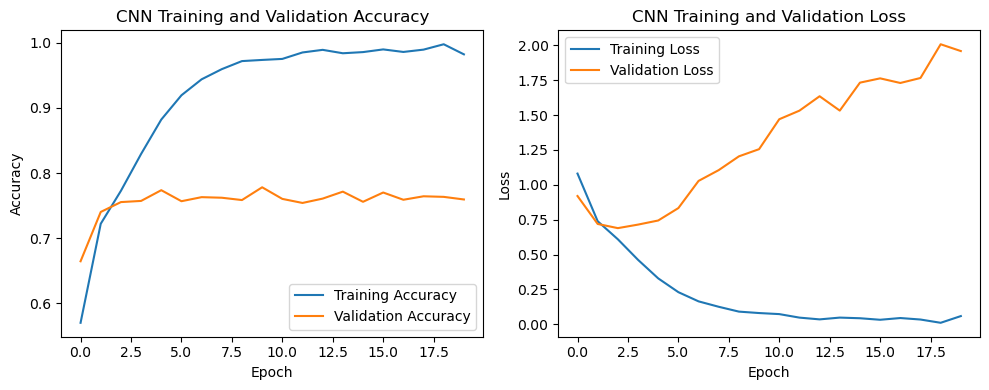

In [89]:
# Plot CNN Learning Curves

plt.figure(figsize=(10, 4))

# Plot Training and Validation Accuracy
plt.subplot(1, 2, 1)
plt.plot(cnn_history.history["accuracy"], label="Training Accuracy")
plt.plot(cnn_history.history["val_accuracy"], label="Validation Accuracy")
plt.title("CNN Training and Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()

# Plot Training and Validation Loss
plt.subplot(1, 2, 2)
plt.plot(cnn_history.history["loss"], label="Training Loss")
plt.plot(cnn_history.history["val_loss"], label="Validation Loss")
plt.title("CNN Training and Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

# Adjust Layout
plt.tight_layout()

# Display Learning Curves
plt.show()

### Insights

The training accuracy increases steadily from approximately **57% to 99%**, while the validation accuracy improves initially and then remains relatively stable around **75–77%**. This indicates that the model learns the training images very effectively, but its ability to generalize to unseen validation images becomes limited after the initial epochs.

The training loss continuously decreases to a very low value, whereas the validation loss reaches its lowest point in the early epochs and then **increases substantially**, reaching approximately **2.0** by the later epochs. The growing gap between training and validation performance is a clear indication of **overfitting**.

Therefore, the model achieves strong performance on the training data but does not generalize equally well to unseen images. This indicates the need for **regularization and improved training strategies**, such as Batch Normalization, Data Augmentation, or Transfer Learning, to improve generalization.

## Visualize CNN prediction

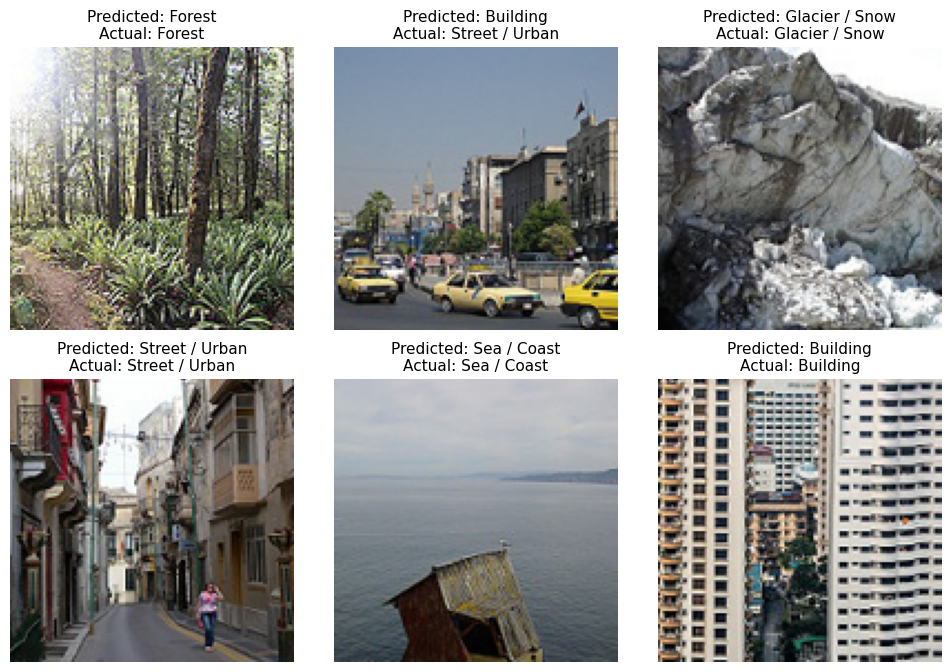

In [94]:
# Visualize CNN Predictions on Test Images

plt.figure(figsize=(10, 7))

# Display Selected Test Images
for i, index in enumerate(sample_indices):
    
    # Get Predicted and Actual Labels
    predicted_label = y_pred_cnn[index]
    actual_label = y_test[index]
    
    # Display Image
    plt.subplot(2, 3, i + 1)
    plt.imshow(X_test[index])
    
    # Display Prediction and Actual Class
    plt.title(
        f"Predicted: {class_names[predicted_label]}\n"
        f"Actual: {class_names[actual_label]}",
        fontsize=11
    )
    
    # Remove Axes
    plt.axis("off")

# Adjust Spacing
plt.tight_layout(pad=2)

# Display Predictions
plt.show()

## Single Image Prediction with Confidence

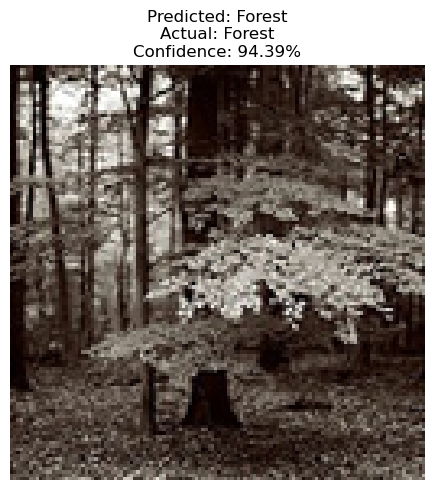

In [96]:
# Single Image Prediction with Visualization

# Select One Test Image
index = 0

# Get the Selected Image and Actual Label
single_image = X_test[index]
actual_label = y_test[index]

# Add Batch Dimension for Model Prediction
single_image_input = np.expand_dims(single_image, axis=0)

# Generate Prediction Probabilities
prediction_prob = best_cnn_model.predict(
    single_image_input,
    verbose=0
)

# Get Predicted Class
predicted_label = np.argmax(prediction_prob, axis=1)[0]

# Get Prediction Confidence
confidence = np.max(prediction_prob) * 100

# Display the Image
plt.figure(figsize=(5, 5))
plt.imshow(single_image)

# Display Prediction Results
plt.title(
    f"Predicted: {class_names[predicted_label]}\n"
    f"Actual: {class_names[actual_label]}\n"
    f"Confidence: {confidence:.2f}%",
    fontsize=12
)

# Remove Axes
plt.axis("off")

# Adjust Layout
plt.tight_layout()

# Display Image and Prediction
plt.show()

### Baseline CNN Model Conclusion

The baseline CNN achieved a **test accuracy of 76.06%** for classifying images into the six predefined categories: **Building, Forest, Glacier / Snow, Mountain, Sea / Coast, and Street / Urban**. This demonstrates that the CNN architecture can effectively learn visual representations from diverse scene images and perform meaningful multi-class classification.

The baseline model provides a strong foundation for further development of the image classification system. Further architectural and training improvements can be explored to enhance the model's ability to **generalize across different visual scenes** and improve classification reliability.

# Improved CNN Model

An Improved CNN is an enhanced version of the baseline Convolutional Neural Network that incorporates additional regularization and normalization techniques to improve learning stability and generalization for the six-category image classification task.

### Improvements Applied

The baseline CNN showed signs of overfitting, as observed from the gap between training and validation performance. To improve generalization, the following techniques will be introduced:

- **Batch Normalization:** Helps stabilize the learning process and supports more consistent training.
- **Dropout:** Randomly deactivates a proportion of neurons during training to reduce overfitting.

These improvements are intended to build a more robust CNN model that generalizes better to unseen images.

In [25]:
# Import Required Libraries

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import (
    Conv2D,
    MaxPooling2D,
    BatchNormalization,
    Dropout,
    Flatten,
    Dense
)

# Build the Improved CNN Model

improved_cnn_model = Sequential()

# First Convolutional Block
improved_cnn_model.add(
    Conv2D(32, (3, 3), activation="relu", input_shape=(128, 128, 3))
)
improved_cnn_model.add(BatchNormalization())
improved_cnn_model.add(MaxPooling2D((2, 2)))
improved_cnn_model.add(Dropout(0.25))

# Second Convolutional Block
improved_cnn_model.add(
    Conv2D(64, (3, 3), activation="relu")
)
improved_cnn_model.add(BatchNormalization())
improved_cnn_model.add(MaxPooling2D((2, 2)))
improved_cnn_model.add(Dropout(0.25))

# Third Convolutional Block
improved_cnn_model.add(
    Conv2D(128, (3, 3), activation="relu")
)
improved_cnn_model.add(BatchNormalization())
improved_cnn_model.add(MaxPooling2D((2, 2)))
improved_cnn_model.add(Dropout(0.25))

# Flatten Feature Maps
improved_cnn_model.add(Flatten())

# Fully Connected Layer
improved_cnn_model.add(Dense(128, activation="relu"))
improved_cnn_model.add(Dropout(0.5))

# Output Layer for 6-Class Classification
improved_cnn_model.add(Dense(6, activation="softmax"))

# Display Model Architecture
improved_cnn_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 126, 126, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 126, 126, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 63, 63, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 63, 63, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 61, 61, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 61, 61, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 28, 28, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 28, 28, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 14, 14, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 14, 14, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     3,211,392 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,306,310 (12.61 MB)

 Trainable params: 3,305,862 (12.61 MB)

 Non-trainable params: 448 (1.75 KB)

In [26]:
# Compile the Improved CNN Model

improved_cnn_model.compile(
    optimizer="adam",                         # Optimizer for updating model weights
    loss="sparse_categorical_crossentropy",   # Loss function for integer class labels
    metrics=["accuracy"]                      # Evaluation metric for classification
)

In [28]:
# Define Model Checkpoint for Improved CNN
from tensorflow.keras.callbacks import ModelCheckpoint

improved_cnn_checkpoint = ModelCheckpoint(
    "best_improved_cnn_model.keras",  # File name for the best model
    monitor="val_loss",               # Monitor validation loss
    save_best_only=True,               # Save only the best-performing model
    mode="min",                        # Lower validation loss is better
    verbose=1                          # Display when the model is saved
)

In [29]:
# Train the Improved CNN Model

improved_cnn_history = improved_cnn_model.fit(
    X_train,                              # Training images
    y_train,                              # Training labels
    epochs=20,                            # Number of training iterations
    batch_size=32,                        # Number of samples processed per update
    validation_split=0.2,                 # Use 20% of training data for validation
    callbacks=[improved_cnn_checkpoint],  # Save the best model during training
    verbose=1                             # Display training progress
)

Epoch 1/20
281/281 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.3289 - loss: 2.9382
Epoch 1: val_loss improved from None to 3.36486, saving model to best_improved_cnn_model.keras

Epoch 1: finished saving model to best_improved_cnn_model.keras
281/281 ━━━━━━━━━━━━━━━━━━━━ 341s 1s/step - accuracy: 0.3471 - loss: 1.9094 - val_accuracy: 0.3321 - val_loss: 3.3649
Epoch 2/20
281/281 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.4169 - loss: 1.3950
Epoch 2: val_loss did not improve from 3.36486
281/281 ━━━━━━━━━━━━━━━━━━━━ 350s 1s/step - accuracy: 0.4348 - loss: 1.3651 - val_accuracy: 0.3985 - val_loss: 3.5140
Epoch 3/20
281/281 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.4544 - loss: 1.3166
Epoch 3: val_loss improved from 3.36486 to 2.07199, saving model to best_improved_cnn_model.keras

Epoch 3: finished saving model to best_improved_cnn_model.keras
281/281 ━━━━━━━━━━━━━━━━━━━━ 330s 1s/step - accuracy: 0.4729 - loss: 1.2651 - val_accuracy: 0.4426 - val_loss: 2.0720
Epoch 4/20
281/281 ━━

In [33]:
# Load the Best Improved CNN Model
from tensorflow.keras.models import load_model
# Load the Best Improved CNN Model

best_improved_cnn_model = load_model(
    "best_improved_cnn_model.keras"
)

In [34]:
# Evaluate the Best Improved CNN Model on Test Data

improved_cnn_test_loss, improved_cnn_test_accuracy = best_improved_cnn_model.evaluate(
    X_test,                    # Test images
    y_test,                    # Test labels
    verbose=1                  # Display evaluation progress
)

# Display Test Performance
print("Improved CNN Test Loss:", improved_cnn_test_loss)
print("Improved CNN Test Accuracy:", improved_cnn_test_accuracy)
print(f"Improved CNN Test Accuracy: {improved_cnn_test_accuracy * 100:.2f}%")

88/88 ━━━━━━━━━━━━━━━━━━━━ 19s 203ms/step - accuracy: 0.8058 - loss: 0.6555
Improved CNN Test Loss: 0.6555291414260864
Improved CNN Test Accuracy: 0.8058425188064575
Improved CNN Test Accuracy: 80.58%


In [35]:
# Generate Predictions Using the Best Improved CNN Model

improved_cnn_pred_prob = best_improved_cnn_model.predict(
    X_test,                    # Test images
    verbose=1                  # Display prediction progress
)

# Convert Probabilities to Predicted Class Labels
improved_cnn_pred = np.argmax(
    improved_cnn_pred_prob,
    axis=1
)

# Display First 10 Predictions
print("Predicted Labels:", improved_cnn_pred[:10])
print("Actual Labels:   ", y_test[:10])

88/88 ━━━━━━━━━━━━━━━━━━━━ 17s 188ms/step
Predicted Labels: [5 2 2 0 0 3 4 3 4 5]
Actual Labels:    [1 2 3 0 0 3 4 4 4 5]


## Classification report

In [37]:
# Generate Classification Report for Improved CNN

from sklearn.metrics import classification_report

# Define Class Names
class_names = [
    "Building",
    "Forest",
    "Glacier / Snow",
    "Mountain",
    "Sea / Coast",
    "Street / Urban"
]

# Generate Classification Report
improved_cnn_report = classification_report(
    y_test,
    improved_cnn_pred,
    target_names=class_names
)

# Display Classification Report
print(improved_cnn_report)

                precision    recall  f1-score   support

      Building       0.74      0.88      0.80       438
        Forest       0.99      0.84      0.91       454
Glacier / Snow       0.73      0.83      0.78       481
      Mountain       0.78      0.72      0.75       503
   Sea / Coast       0.85      0.77      0.81       455
Street / Urban       0.80      0.80      0.80       476

      accuracy                           0.81      2807
     macro avg       0.82      0.81      0.81      2807
  weighted avg       0.81      0.81      0.81      2807



## Confusion Matrix

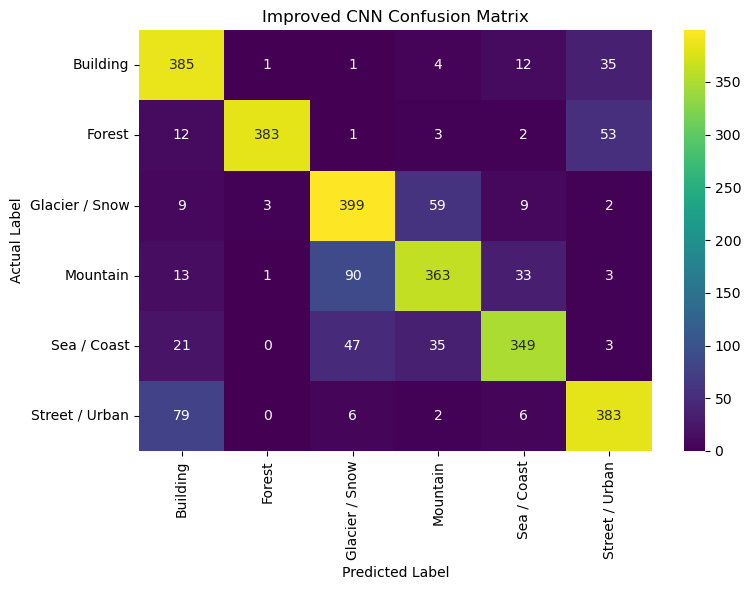

In [38]:
# Generate Confusion Matrix for Improved CNN

from sklearn.metrics import confusion_matrix

# Calculate Confusion Matrix
cm_improved_cnn = confusion_matrix(
    y_test,
    improved_cnn_pred
)

# Plot Confusion Matrix
plt.figure(figsize=(8, 6))

sns.heatmap(
    cm_improved_cnn,
    annot=True,
    fmt="d",
    cmap="viridis",
    xticklabels=class_names,
    yticklabels=class_names
)

# Add Plot Labels
plt.title("Improved CNN Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")

# Adjust Layout
plt.tight_layout()

# Display Confusion Matrix
plt.show()

### Insights

- The model shows strong classification across all six categories, with high correct predictions for **Building (385)**, **Forest (383)**, **Glacier / Snow (399)**, **Mountain (363)**, **Sea / Coast (349)**, and **Street / Urban (383)**.
- The most noticeable confusion occurs between **Mountain and Glacier / Snow**, with **90 Mountain images classified as Glacier / Snow** and **59 Glacier / Snow images classified as Mountain**.
- Additional confusion is observed between **Sea / Coast and Glacier / Snow**, and between **Street / Urban and Building**, indicating that some visually similar natural and urban scenes remain challenging to distinguish.
- Overall, the confusion matrix indicates that the Improved CNN has learned the visual characteristics of the six scene categories effectively, while some visually similar environmental and urban scenes remain challenging to distinguish.

## Improved CNN learning curves

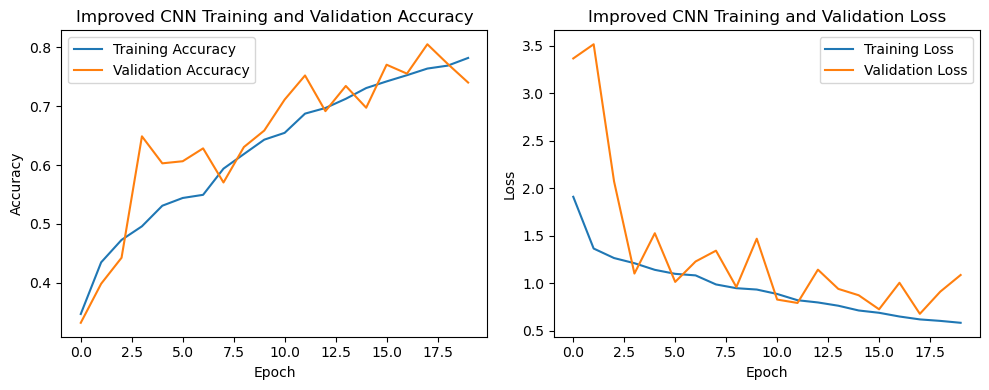

In [40]:
# Plot Improved CNN Learning Curves

plt.figure(figsize=(10, 4))

# Plot Training and Validation Accuracy
plt.subplot(1, 2, 1)
plt.plot(
    improved_cnn_history.history["accuracy"],
    label="Training Accuracy"
)
plt.plot(
    improved_cnn_history.history["val_accuracy"],
    label="Validation Accuracy"
)
plt.title("Improved CNN Training and Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()

# Plot Training and Validation Loss
plt.subplot(1, 2, 2)
plt.plot(
    improved_cnn_history.history["loss"],
    label="Training Loss"
)
plt.plot(
    improved_cnn_history.history["val_loss"],
    label="Validation Loss"
)
plt.title("Improved CNN Training and Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

# Adjust Layout
plt.tight_layout()

# Display Learning Curves
plt.show()

### Insights

- **Training accuracy steadily improves** from approximately 33% to 79%, while validation accuracy also increases and reaches around **80%**, indicating that the model continues to learn useful visual patterns throughout training.
- **Training loss decreases consistently** from approximately 1.9 to 0.59, while validation loss shows some fluctuations but generally remains substantially lower than its initial value, indicating improved learning stability.
- The relatively smaller gap between training and validation accuracy indicates **better generalization**, although the fluctuations in validation accuracy and loss suggest that some variability remains in performance across epochs.

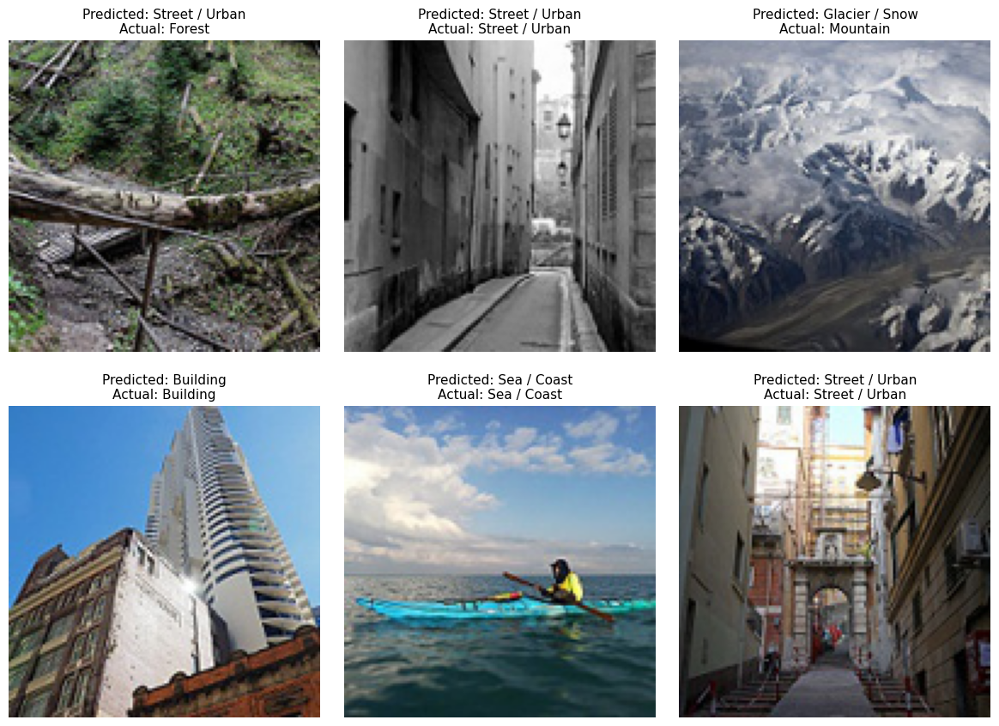

In [41]:
# Visualize Improved CNN Predictions on Test Images

# Select Sample Test Images
sample_indices = np.random.choice(len(X_test), 6, replace=False)

# Create Prediction Visualization
plt.figure(figsize=(12, 9))

for i, index in enumerate(sample_indices):
    
    # Get Predicted and Actual Labels
    predicted_label = improved_cnn_pred[index]
    actual_label = y_test[index]
    
    # Display Image
    plt.subplot(2, 3, i + 1)
    plt.imshow(X_test[index])
    
    # Display Prediction and Actual Class
    plt.title(
        f"Predicted: {class_names[predicted_label]}\n"
        f"Actual: {class_names[actual_label]}",
        fontsize=11
    )
    
    # Remove Axes
    plt.axis("off")

# Adjust Layout
plt.tight_layout(pad=2)

# Display Predictions
plt.show()

## Single Image prediction with Confidence

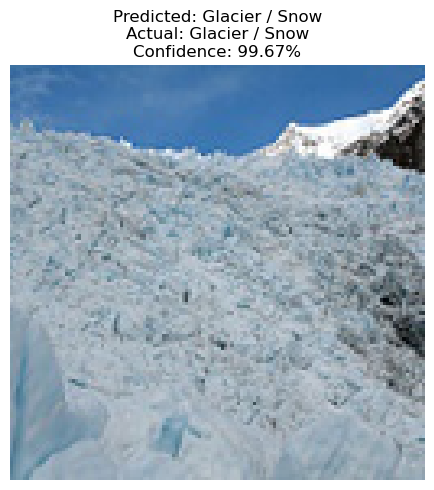

In [43]:
# Single Image Prediction Using the Improved CNN

# Select One Test Image
index = 1

# Get the Selected Image and Actual Label
single_image = X_test[index]
actual_label = y_test[index]

# Add Batch Dimension for Model Prediction
single_image_input = np.expand_dims(single_image, axis=0)

# Generate Prediction Probabilities
prediction_prob = best_improved_cnn_model.predict(
    single_image_input,
    verbose=0
)

# Get Predicted Class
predicted_label = np.argmax(prediction_prob, axis=1)[0]

# Get Prediction Confidence
confidence = np.max(prediction_prob) * 100

# Display the Image
plt.figure(figsize=(5, 5))
plt.imshow(single_image)

# Display Prediction Results
plt.title(
    f"Predicted: {class_names[predicted_label]}\n"
    f"Actual: {class_names[actual_label]}\n"
    f"Confidence: {confidence:.2f}%",
    fontsize=12
)

# Remove Axes
plt.axis("off")

# Adjust Layout
plt.tight_layout()

# Display Image and Prediction
plt.show()

### Improved CNN Model Conclusion

- The Improved CNN achieved a **test accuracy of 80.58%**, demonstrating its ability to effectively classify images across the six scene categories. The model showed consistent classification capability across different types of natural and urban scenes.
- The use of **Batch Normalization and Dropout** improved the model's robustness and generalization when classifying unseen images. The model effectively learned visual patterns across the different scene categories, although some visually similar landscapes remained challenging to distinguish.
- As a result, the Improved CNN provides a **more robust image classification model for the given six-category scene classification task**, making it a suitable intermediate model for further performance enhancement.

# CNN with Data Augmentation

Data Augmentation is a technique that creates varied training samples by applying transformations such as rotation, shifting, zooming, and horizontal flipping to existing images.

For this six-category scene classification task, augmentation can increase the diversity of training images and help the CNN learn more robust visual patterns.

In [21]:
# Split Training Data into Training and Validation Sets

X_train_aug, X_val_aug, y_train_aug, y_val_aug = train_test_split(
    X_train,
    y_train,
    test_size=0.20,
    random_state=42,
    stratify=y_train
)

print("Training Images:", X_train_aug.shape)
print("Validation Images:", X_val_aug.shape)
print("Training Labels:", y_train_aug.shape)
print("Validation Labels:", y_val_aug.shape)

Training Images: (8981, 128, 128, 3)
Validation Images: (2246, 128, 128, 3)
Training Labels: (8981,)
Validation Labels: (2246,)


In [22]:
# Import Image Data Generator

from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define Data Augmentation

datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True,
    zoom_range=0.2
)

datagen.fit(X_train_aug)

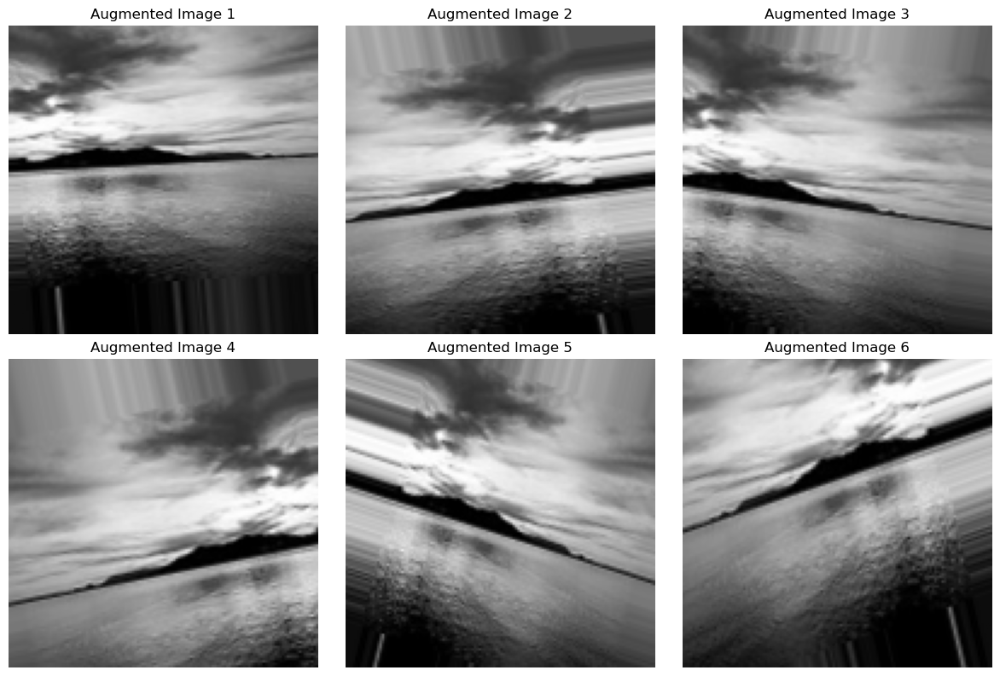

In [23]:
# Visualize Augmented Images

# Select One Training Sample Image
sample_image = X_train_aug[0]

# Add Batch Dimension
sample_image = np.expand_dims(sample_image, axis=0)

# Create Augmented Image Generator
augmented_images = datagen.flow(
    sample_image,
    batch_size=1
)

# Create Visualization
plt.figure(figsize=(12, 8))

for i in range(6):

    # Generate Augmented Image
    augmented_image = next(augmented_images)[0]

    # Display Augmented Image
    plt.subplot(2, 3, i + 1)
    plt.imshow(augmented_image)
    plt.axis("off")
    plt.title(f"Augmented Image {i + 1}")

plt.tight_layout()
plt.show()

In [24]:
# Import Required Libraries

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import (
    Conv2D,
    MaxPooling2D,
    BatchNormalization,
    Dropout,
    Flatten,
    Dense
)

# Build CNN Model with Data Augmentation

augmented_cnn_model = Sequential()

# First Convolutional Block
augmented_cnn_model.add(
    Conv2D(32, (3, 3), activation="relu", input_shape=(128, 128, 3))
)
augmented_cnn_model.add(BatchNormalization())
augmented_cnn_model.add(MaxPooling2D((2, 2)))
augmented_cnn_model.add(Dropout(0.25))

# Second Convolutional Block
augmented_cnn_model.add(
    Conv2D(64, (3, 3), activation="relu")
)
augmented_cnn_model.add(BatchNormalization())
augmented_cnn_model.add(MaxPooling2D((2, 2)))
augmented_cnn_model.add(Dropout(0.25))

# Third Convolutional Block
augmented_cnn_model.add(
    Conv2D(128, (3, 3), activation="relu")
)
augmented_cnn_model.add(BatchNormalization())
augmented_cnn_model.add(MaxPooling2D((2, 2)))
augmented_cnn_model.add(Dropout(0.25))

# Flatten Feature Maps
augmented_cnn_model.add(Flatten())

# Fully Connected Layer
augmented_cnn_model.add(Dense(128, activation="relu"))
augmented_cnn_model.add(Dropout(0.5))

# Output Layer for 6-Class Classification
augmented_cnn_model.add(Dense(6, activation="softmax"))

# Display Model Architecture
augmented_cnn_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 126, 126, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 126, 126, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 63, 63, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 63, 63, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 61, 61, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 61, 61, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 28, 28, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 28, 28, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 14, 14, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 14, 14, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     3,211,392 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,306,310 (12.61 MB)

 Trainable params: 3,305,862 (12.61 MB)

 Non-trainable params: 448 (1.75 KB)

In [25]:
# Compile the Augmented CNN Model

augmented_cnn_model.compile(
    optimizer="adam",                         # Optimizer for updating model weights
    loss="sparse_categorical_crossentropy",   # Loss function for integer class labels
    metrics=["accuracy"]                      # Evaluation metric for classification
)

In [26]:
# Define Model Checkpoint for Augmented CNN

from tensorflow.keras.callbacks import ModelCheckpoint
augmented_cnn_checkpoint = ModelCheckpoint(
    "best_augmented_cnn_model.keras",  # File name for the best model
    monitor="val_loss",                # Monitor validation loss
    save_best_only=True,                # Save only the best-performing model
    mode="min",                         # Lower validation loss is better
    verbose=1                           # Display when the model is saved
)

In [27]:
# Train the Augmented CNN Model

augmented_cnn_history = augmented_cnn_model.fit(
    datagen.flow(
        X_train_aug,
        y_train_aug,
        batch_size=32,
        shuffle=True
    ),
    epochs=20,
    validation_data=(X_val_aug, y_val_aug),
    callbacks=[augmented_cnn_checkpoint]
)

Epoch 1/20
281/281 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.3312 - loss: 2.6849
Epoch 1: val_loss improved from None to 1.82148, saving model to best_augmented_cnn_model.keras

Epoch 1: finished saving model to best_augmented_cnn_model.keras
281/281 ━━━━━━━━━━━━━━━━━━━━ 329s 1s/step - accuracy: 0.3745 - loss: 1.7781 - val_accuracy: 0.3366 - val_loss: 1.8215
Epoch 2/20
281/281 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.4112 - loss: 1.4233
Epoch 2: val_loss did not improve from 1.82148
281/281 ━━━━━━━━━━━━━━━━━━━━ 318s 1s/step - accuracy: 0.4113 - loss: 1.4147 - val_accuracy: 0.4199 - val_loss: 2.1305
Epoch 3/20
281/281 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.4270 - loss: 1.3831
Epoch 3: val_loss improved from 1.82148 to 1.51553, saving model to best_augmented_cnn_model.keras

Epoch 3: finished saving model to best_augmented_cnn_model.keras
281/281 ━━━━━━━━━━━━━━━━━━━━ 314s 1s/step - accuracy: 0.4271 - loss: 1.3674 - val_accuracy: 0.4813 - val_loss: 1.5155
Epoch 4/20
281/28

In [28]:
# Load the Best Augmented CNN Model

from tensorflow.keras.models import load_model
best_augmented_cnn_model = load_model(
    "best_augmented_cnn_model.keras"
)

In [29]:
# Evaluate the Best Augmented CNN Model on Test Data

augmented_cnn_test_loss, augmented_cnn_test_accuracy = best_augmented_cnn_model.evaluate(
    X_test,                    # Original test images
    y_test,                    # Test labels
    verbose=1                  # Display evaluation progress
)

# Display Test Performance
print("Augmented CNN Test Loss:", augmented_cnn_test_loss)
print("Augmented CNN Test Accuracy:", augmented_cnn_test_accuracy)

88/88 ━━━━━━━━━━━━━━━━━━━━ 17s 179ms/step - accuracy: 0.7403 - loss: 0.7547
Augmented CNN Test Loss: 0.7546856999397278
Augmented CNN Test Accuracy: 0.7402921319007874


In [30]:
# Generate Predictions Using the Best Augmented CNN Model

augmented_cnn_pred_prob = best_augmented_cnn_model.predict(
    X_test,                    # Original test images
    verbose=1                  # Display prediction progress
)

# Convert Probabilities to Predicted Class Labels
augmented_cnn_pred = np.argmax(
    augmented_cnn_pred_prob,
    axis=1
)

# Display First 10 Predictions
print("Predicted Labels:", augmented_cnn_pred[:10])
print("Actual Labels:   ", y_test[:10])

88/88 ━━━━━━━━━━━━━━━━━━━━ 16s 177ms/step
Predicted Labels: [1 2 3 5 5 4 4 3 4 5]
Actual Labels:    [1 2 3 0 0 3 4 4 4 5]


## Classification Report

In [31]:
# Generate Classification Report for Augmented CNN

from sklearn.metrics import classification_report

# Define Class Names
class_names = [
    "Building",
    "Forest",
    "Glacier / Snow",
    "Mountain",
    "Sea / Coast",
    "Street / Urban"
]

# Generate Classification Report
augmented_cnn_report = classification_report(
    y_test,
    augmented_cnn_pred,
    target_names=class_names
)

# Display Classification Report
print(augmented_cnn_report)

                precision    recall  f1-score   support

      Building       0.62      0.62      0.62       438
        Forest       0.94      0.93      0.94       454
Glacier / Snow       0.81      0.59      0.68       481
      Mountain       0.65      0.77      0.71       503
   Sea / Coast       0.84      0.64      0.73       455
Street / Urban       0.68      0.88      0.77       476

      accuracy                           0.74      2807
     macro avg       0.76      0.74      0.74      2807
  weighted avg       0.75      0.74      0.74      2807



## Confusion Matrix

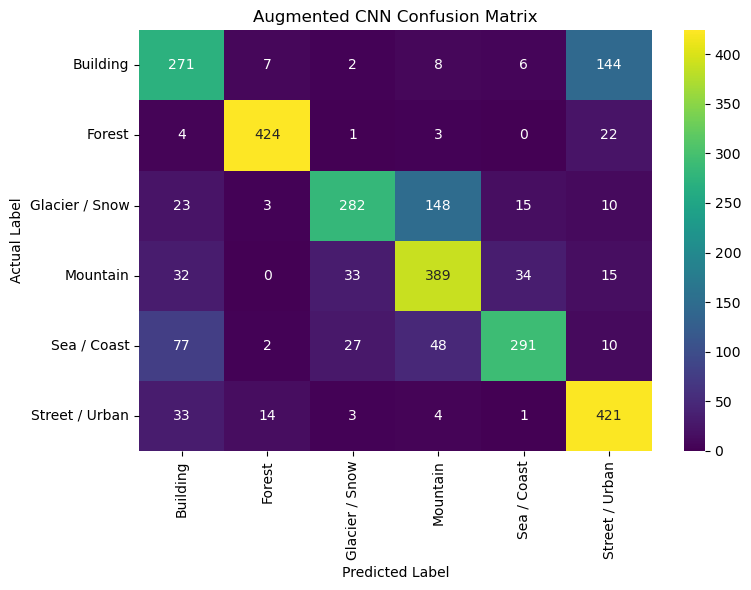

In [32]:
# Generate Confusion Matrix for Augmented CNN

from sklearn.metrics import confusion_matrix

# Calculate Confusion Matrix
cm_augmented_cnn = confusion_matrix(
    y_test,
    augmented_cnn_pred
)

# Plot Confusion Matrix
plt.figure(figsize=(8, 6))

sns.heatmap(
    cm_augmented_cnn,
    annot=True,
    fmt="d",
    cmap="viridis",
    xticklabels=class_names,
    yticklabels=class_names
)

# Add Plot Labels
plt.title("Augmented CNN Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")

# Adjust Layout
plt.tight_layout()

# Display Confusion Matrix
plt.show()

### Insights

- The confusion matrix shows that the model correctly classifies a substantial number of images across all six scene categories.
- The strongest correct classifications are observed for **Forest**, **Street / Urban**, and **Mountain** scenes based on the number of correct predictions along the diagonal.
- The most noticeable confusion occurs between **Glacier / Snow and Mountain**, with several images from each category being misclassified as the other.
- A significant number of **Building images are classified as Street / Urban**, indicating visual similarity between these two scene categories.
- Some **Sea / Coast images are misclassified as Building**, suggesting that certain coastal scenes may contain structures or visual patterns similar to urban scenes.

## Augmented CNN Learning Curves

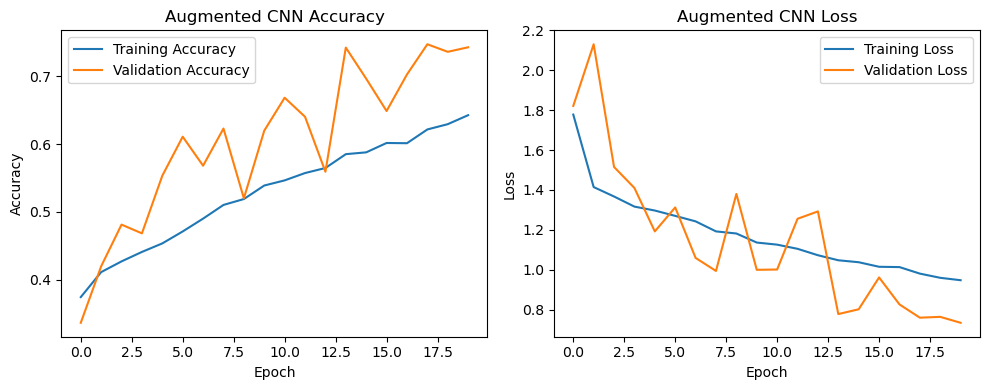

In [33]:
# Plot Augmented CNN Learning Curves

plt.figure(figsize=(10, 4))

# Plot Training and Validation Accuracy
plt.subplot(1, 2, 1)
plt.plot(augmented_cnn_history.history["accuracy"], label="Training Accuracy")
plt.plot(augmented_cnn_history.history["val_accuracy"], label="Validation Accuracy")
plt.title("Augmented CNN Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()

# Plot Training and Validation Loss
plt.subplot(1, 2, 2)
plt.plot(augmented_cnn_history.history["loss"], label="Training Loss")
plt.plot(augmented_cnn_history.history["val_loss"], label="Validation Loss")
plt.title("Augmented CNN Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

# Adjust Layout
plt.tight_layout()

# Display Learning Curves
plt.show()

### Insights

- **Training accuracy steadily increases** throughout the 20 epochs, indicating that the Augmented CNN is progressively learning useful visual features from the training images.
- **Validation accuracy fluctuates across epochs** but shows an overall improvement and reaches approximately **74% by the final epoch**.
- **Training loss gradually decreases** throughout the training process, indicating consistent learning by the model.
- **Validation loss also fluctuates but follows an overall decreasing trend**, reaching its lowest value toward the later epochs.
- The **fluctuations in validation accuracy and loss** indicate some variation in model performance across epochs, while the overall trends suggest that **data augmentation and regularization are helping the model generalize to unseen validation images**.

## Visualize Augmented CNN Predictions

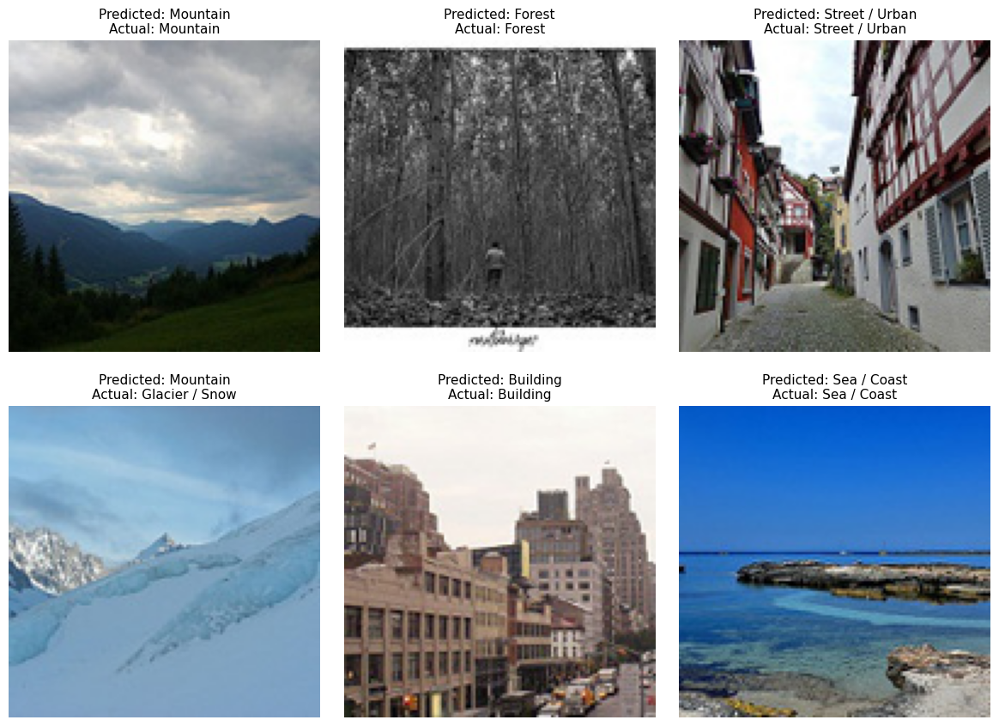

In [34]:
# Visualize Augmented CNN Predictions on Test Images

sample_indices = np.random.choice(len(X_test), 6, replace=False)

plt.figure(figsize=(12, 9))

for i, index in enumerate(sample_indices):
    
    # Get Predicted and Actual Labels
    predicted_label = augmented_cnn_pred[index]
    actual_label = y_test[index]
    
    # Display Image
    plt.subplot(2, 3, i + 1)
    plt.imshow(X_test[index])
    
    # Display Prediction and Actual Class
    plt.title(
        f"Predicted: {class_names[predicted_label]}\n"
        f"Actual: {class_names[actual_label]}",
        fontsize=11
    )
    
    # Hide Axis
    plt.axis("off")

# Adjust Layout
plt.tight_layout(pad=2)

# Display Predictions
plt.show()

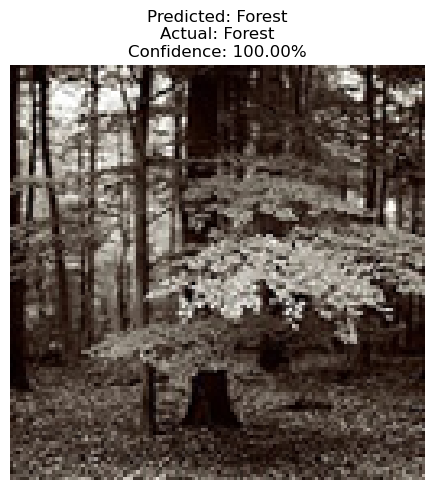

In [36]:
# Single Image Prediction Using the Augmented CNN

# Select One Test Image
index = 0

# Get Image and Actual Label
single_image = X_test[index]
actual_label = y_test[index]

# Add Batch Dimension for Model Input
single_image_input = np.expand_dims(single_image, axis=0)

# Generate Prediction Probabilities
prediction_prob = best_augmented_cnn_model.predict(
    single_image_input,
    verbose=0
)

# Get Predicted Class
predicted_label = np.argmax(prediction_prob, axis=1)[0]

# Calculate Prediction Confidence
confidence = np.max(prediction_prob) * 100

# Display Image and Prediction
plt.figure(figsize=(5, 5))
plt.imshow(single_image)

plt.title(
    f"Predicted: {class_names[predicted_label]}\n"
    f"Actual: {class_names[actual_label]}\n"
    f"Confidence: {confidence:.2f}%",
    fontsize=12
)

# Hide Axis
plt.axis("off")

# Adjust Layout
plt.tight_layout()

# Display Result
plt.show()

### Augmented CNN Model Conclusion

The Augmented CNN achieved a **test accuracy of 74.03%** across the six scene categories. Data Augmentation, Batch Normalization, and Dropout helped the model learn more varied visual patterns and improve generalization.

The model performed strongly on **Forest** and **Street / Urban** scenes, while **Building** and **Glacier / Snow** had comparatively lower recall. The confusion matrix also shows difficulty distinguishing **Glacier / Snow from Mountain** scenes.

In conclusion, the Augmented CNN demonstrated effective learning, although its test performance was lower than the Improved CNN in this experiment.

### Note on Training and Validation Data

`X_train_aug` and `X_val_aug` represent the stratified training and validation splits used for the deep learning models. For the **Augmented CNN**, data augmentation is applied separately through `ImageDataGenerator`. MobileNetV2 and ResNet50 use the same underlying training and validation splits without the augmentation generator.

# Transfer Learning

# MobileNetV2

MobileNetV2 is a lightweight convolutional neural network designed for efficient image classification. In this project, a pretrained MobileNetV2 model will be used as a feature extractor, followed by a custom classification head for the six scene categories.

In [40]:
# Import MobileNetV2 Pre-trained Model

from tensorflow.keras.applications import MobileNetV2

# Import MobileNetV2-Specific Image Preprocessing Function

from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

In [41]:
# Prepare Images for MobileNetV2

# Convert Training Images from 0–1 Range to 0–255 Range
X_train_mobilenet = X_train_aug.copy() * 255.0

# Apply MobileNetV2-Specific Preprocessing to Training Images
X_train_mobilenet = preprocess_input(X_train_mobilenet)


# Convert Validation Images from 0–1 Range to 0–255 Range
X_val_mobilenet = X_val_aug.copy() * 255.0

# Apply MobileNetV2-Specific Preprocessing to Validation Images
X_val_mobilenet = preprocess_input(X_val_mobilenet)


# Convert Test Images from 0–1 Range to 0–255 Range
X_test_mobilenet = X_test.copy() * 255.0

# Apply MobileNetV2-Specific Preprocessing to Test Images
X_test_mobilenet = preprocess_input(X_test_mobilenet)


# Display the Shape of the Processed Datasets
print("Training Images Shape:", X_train_mobilenet.shape)
print("Validation Images Shape:", X_val_mobilenet.shape)
print("Test Images Shape:", X_test_mobilenet.shape)

Training Images Shape: (8981, 128, 128, 3)
Validation Images Shape: (2246, 128, 128, 3)
Test Images Shape: (2807, 128, 128, 3)


In [42]:
# Verify MobileNetV2 Preprocessed Pixel Value Range

print(
    "Training Pixel Range:",
    X_train_mobilenet.min(),
    "to",
    X_train_mobilenet.max()
)

print(
    "Validation Pixel Range:",
    X_val_mobilenet.min(),
    "to",
    X_val_mobilenet.max()
)

print(
    "Test Pixel Range:",
    X_test_mobilenet.min(),
    "to",
    X_test_mobilenet.max()
)

Training Pixel Range: -1.0 to 1.0
Validation Pixel Range: -1.0 to 1.0
Test Pixel Range: -1.0 to 1.0


#### The pixel values range from -1 to 1 because MobileNetV2-specific preprocessing scales the original pixel values from 0–255 to the range -1 to 1. This normalization is required to make the input compatible with the pre-trained MobileNetV2 model and its ImageNet-learned features.

In [43]:
# Load Pretrained MobileNetV2 Base Model

mobilenet_base = MobileNetV2(
    weights="imagenet",
    include_top=False,
    input_shape=(128, 128, 3)
)

# Freeze the Pretrained Layers

mobilenet_base.trainable = False

# Display the Base Model Summary

mobilenet_base.summary()

Model: "mobilenetv2_1.00_128"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 64, 64,    │        864 │ input_layer_3[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 64, 64,    │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 64, 64,    │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 64, 64,    │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 64, 64,    │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 64, 64,    │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 64, 64,    │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 64, 64,    │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 64, 64,    │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 64, 64,    │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 64, 64,    │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 65, 65,    │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 32, 32,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 32, 32,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 32, 32,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 32, 32,    │      2,304 │ block_1_depthwis

 Total params: 2,257,984 (8.61 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 2,257,984 (8.61 MB)

In [44]:
# Freeze the Pre-trained MobileNetV2 Base Model

mobilenet_base.trainable = False

# Display Whether the Base Model is Trainable

print("MobileNetV2 Base Model Trainable:", mobilenet_base.trainable)

MobileNetV2 Base Model Trainable: False


In [45]:
# Build MobileNetV2 Transfer Learning Model

mobilenet_model = Sequential([
    mobilenet_base,

    # Global Average Pooling
    GlobalAveragePooling2D(),

    # Fully Connected Layer
    Dense(128, activation="relu"),

    # Dropout for Regularization
    Dropout(0.5),

    # Output Layer for 6 Classes
    Dense(6, activation="softmax")
])

# Display Model Summary

mobilenet_model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_128            │ (None, 4, 4, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,422,726 (9.24 MB)

 Trainable params: 164,742 (643.52 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [46]:
# Compile the MobileNetV2 Transfer Learning Model

mobilenet_model.compile(
    optimizer="adam",
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

In [47]:
# Define Model Checkpoint for MobileNetV2

from tensorflow.keras.callbacks import ModelCheckpoint

mobilenet_checkpoint = ModelCheckpoint(
    "best_mobilenet_model.keras",
    monitor="val_loss",
    save_best_only=True,
    mode="min",
    verbose=1
)

In [48]:
# Train the MobileNetV2 Transfer Learning Model

mobilenet_history = mobilenet_model.fit(
    X_train_mobilenet,
    y_train_aug,
    batch_size=32,
    epochs=20,
    validation_data=(X_val_mobilenet, y_val_aug),
    callbacks=[mobilenet_checkpoint],
    shuffle=True
)

Epoch 1/20
281/281 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step - accuracy: 0.7821 - loss: 0.5829
Epoch 1: val_loss improved from None to 0.27237, saving model to best_mobilenet_model.keras

Epoch 1: finished saving model to best_mobilenet_model.keras
281/281 ━━━━━━━━━━━━━━━━━━━━ 157s 477ms/step - accuracy: 0.8558 - loss: 0.3943 - val_accuracy: 0.9083 - val_loss: 0.2724
Epoch 2/20
281/281 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step - accuracy: 0.9044 - loss: 0.2549
Epoch 2: val_loss improved from 0.27237 to 0.26430, saving model to best_mobilenet_model.keras

Epoch 2: finished saving model to best_mobilenet_model.keras
281/281 ━━━━━━━━━━━━━━━━━━━━ 127s 452ms/step - accuracy: 0.9084 - loss: 0.2477 - val_accuracy: 0.9078 - val_loss: 0.2643
Epoch 3/20
281/281 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step - accuracy: 0.9195 - loss: 0.2051
Epoch 3: val_loss did not improve from 0.26430
281/281 ━━━━━━━━━━━━━━━━━━━━ 127s 453ms/step - accuracy: 0.9196 - loss: 0.2100 - val_accuracy: 0.9101 - val_loss: 0.2665
Epoch 4/20
281/

In [53]:
# Load the Best MobileNetV2 Model
from tensorflow.keras.models import load_model

best_mobilenet_model = load_model("best_mobilenet_model.keras")

# Evaluate the Best MobileNetV2 Model on Test Data
mobilenet_test_loss, mobilenet_test_accuracy = best_mobilenet_model.evaluate(
    X_test_mobilenet,
    y_test,
    verbose=1
)

print(f"MobileNetV2 Test Loss: {mobilenet_test_loss:.4f}")
print(f"MobileNetV2 Test Accuracy: {mobilenet_test_accuracy:.4f}")

88/88 ━━━━━━━━━━━━━━━━━━━━ 41s 361ms/step - accuracy: 0.9063 - loss: 0.2497
MobileNetV2 Test Loss: 0.2497
MobileNetV2 Test Accuracy: 0.9063


In [56]:
# Generate Predictions Using the Best MobileNetV2 Model

mobilenet_pred_prob = best_mobilenet_model.predict(
    X_test_mobilenet,           # MobileNetV2 preprocessed test images
    verbose=1                   # Display prediction progress
)

# Convert Probabilities to Predicted Class Labels
mobilenet_pred = np.argmax(
    mobilenet_pred_prob,
    axis=1
)

# Display First 10 Predictions
print("Predicted Labels:", mobilenet_pred[:10])
print("Actual Labels:   ", y_test[:10])

88/88 ━━━━━━━━━━━━━━━━━━━━ 33s 370ms/step
Predicted Labels: [1 2 3 0 0 3 4 4 4 5]
Actual Labels:    [1 2 3 0 0 3 4 4 4 5]


## Classification Report

In [57]:
# Generate MobileNetV2 Classification Report

from sklearn.metrics import classification_report

print("MobileNetV2 Classification Report")
print(
    classification_report(
        y_test,
        mobilenet_pred,
        target_names=class_names
    )
)

MobileNetV2 Classification Report
                precision    recall  f1-score   support

      Building       0.94      0.89      0.91       438
        Forest       0.99      0.98      0.98       454
Glacier / Snow       0.80      0.90      0.85       481
      Mountain       0.91      0.78      0.84       503
   Sea / Coast       0.94      0.95      0.94       455
Street / Urban       0.89      0.96      0.92       476

      accuracy                           0.91      2807
     macro avg       0.91      0.91      0.91      2807
  weighted avg       0.91      0.91      0.91      2807



## Confusion Matrix

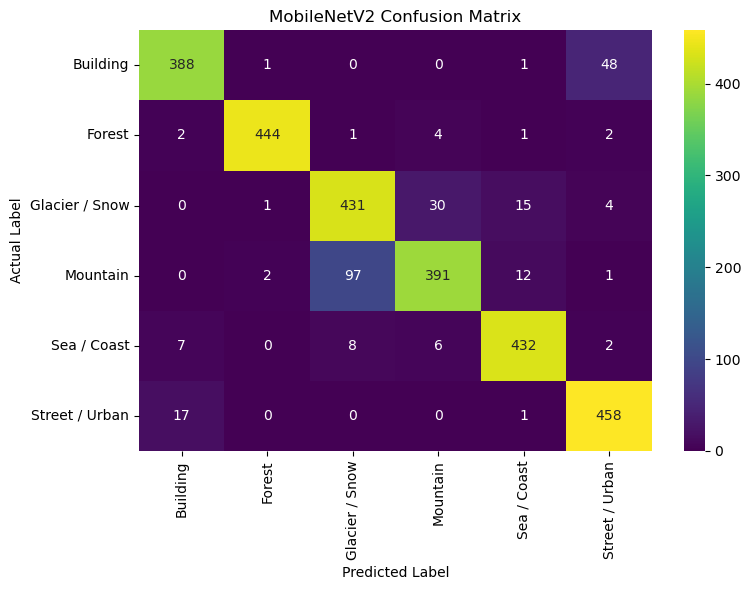

In [58]:
# Generate Confusion Matrix for MobileNetV2

from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate Confusion Matrix
cm_mobilenet = confusion_matrix(y_test, mobilenet_pred)

# Plot Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(
    cm_mobilenet,
    annot=True,
    fmt="d",
    cmap="viridis",
    xticklabels=class_names,
    yticklabels=class_names
)

plt.title("MobileNetV2 Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.tight_layout()
plt.show()

### Insights

- MobileNetV2 achieved **90.63% test accuracy** with strong classification performance across all six categories.
- **Forest** was classified most accurately, with **444 of 454 images** correctly predicted.
- The main misclassification occurred between **Mountain and Glacier / Snow**, with **97 Mountain images** predicted as Glacier / Snow.
- **Building** also showed some confusion with **Street / Urban**, with **48 Building images** predicted as Street / Urban.

## Plot MobileNetV2 Learning Curves

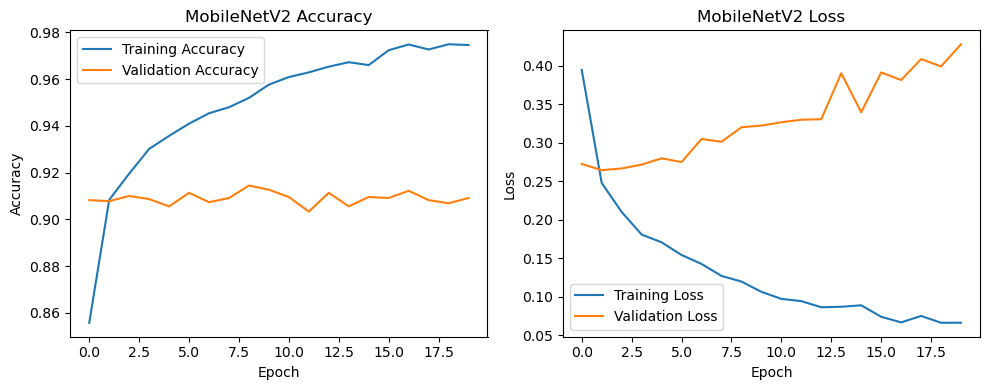

In [60]:
# Plot MobileNetV2 Learning Curves

plt.figure(figsize=(10, 4))

# Plot Training and Validation Accuracy
plt.subplot(1, 2, 1)
plt.plot(mobilenet_history.history["accuracy"], label="Training Accuracy")
plt.plot(mobilenet_history.history["val_accuracy"], label="Validation Accuracy")
plt.title("MobileNetV2 Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()

# Plot Training and Validation Loss
plt.subplot(1, 2, 2)
plt.plot(mobilenet_history.history["loss"], label="Training Loss")
plt.plot(mobilenet_history.history["val_loss"], label="Validation Loss")
plt.title("MobileNetV2 Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

# Adjust Layout
plt.tight_layout()

# Display Learning Curves
plt.show()

### Insights

- MobileNetV2 achieved steadily increasing **training accuracy**, reaching approximately **97.5%**, while validation accuracy remained around **90–91%**.
- The **validation loss was lowest during the early epochs** and gradually increased while training loss continued to decrease, indicating **overfitting** as training progressed.
- The widening gap between training and validation performance suggests that the model learned the training data increasingly well but showed limited improvement on unseen validation data.
- The best model checkpoint was therefore retained based on **validation loss** to preserve better generalization performance.

## Visualize MobileNetV2 Predictions

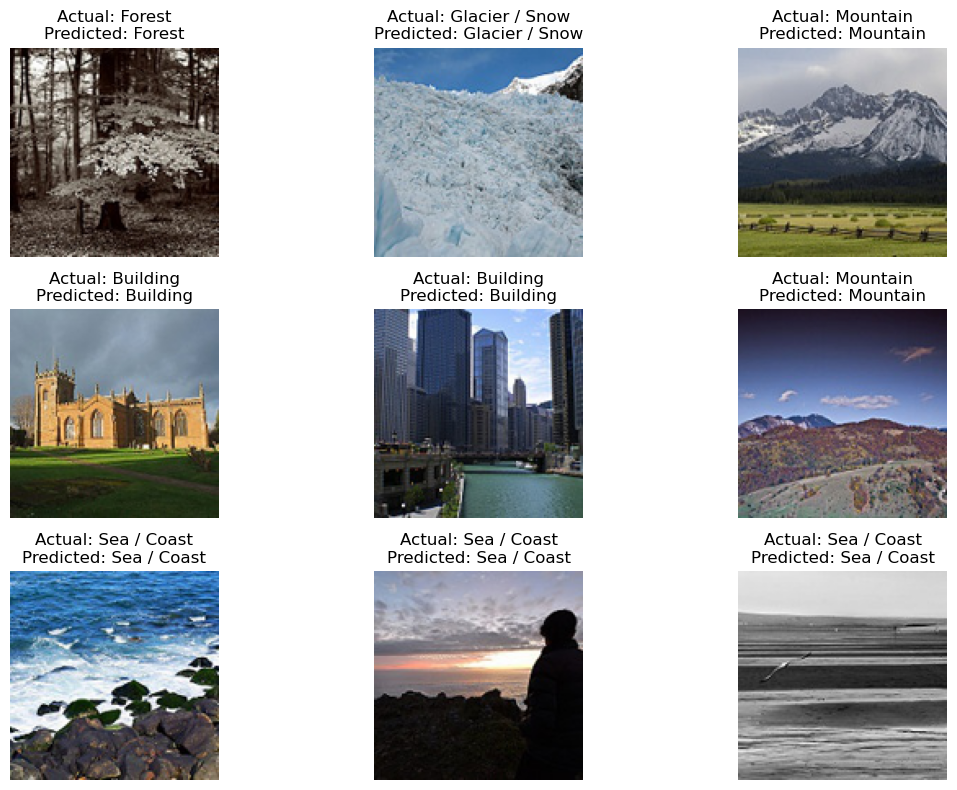

In [104]:
# Visualize MobileNetV2 Predictions

plt.figure(figsize=(12, 8))

for i in range(9):
    plt.subplot(3, 3, i + 1)

    # Display the original test image
    plt.imshow(X_test[i])

    # Get actual and predicted class names
    actual_label = class_names[y_test[i]]
    predicted_label = class_names[mobilenet_pred[i]]

    # Display actual and predicted labels
    plt.title(
        f"Actual: {actual_label}\nPredicted: {predicted_label}"
    )

    plt.axis("off")

# Adjust Layout
plt.tight_layout()

# Display Predictions
plt.show()

## Single Image Prediction with Confidence

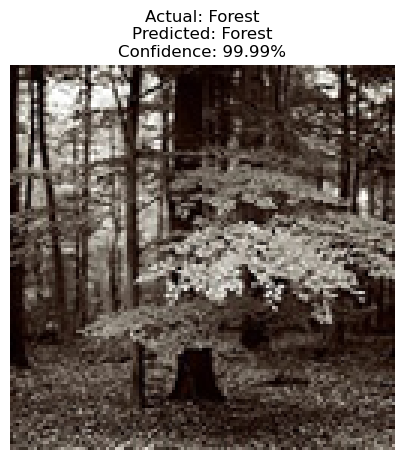

In [62]:
# Single Image Prediction Using MobileNetV2

# Select one test image
image_index = 0

# Get the original test image
image = X_test[image_index]

# Preprocess the image for MobileNetV2
image_mobilenet = image * 255.0
image_mobilenet = tf.keras.applications.mobilenet_v2.preprocess_input(
    image_mobilenet
)

# Add batch dimension
image_mobilenet = np.expand_dims(image_mobilenet, axis=0)

# Generate prediction probabilities
prediction_prob = best_mobilenet_model.predict(
    image_mobilenet,
    verbose=0
)

# Get predicted class and confidence
predicted_class = np.argmax(prediction_prob[0])
confidence = prediction_prob[0][predicted_class] * 100

# Get actual class
actual_class = class_names[y_test[image_index]]

# Display the image and prediction
plt.figure(figsize=(5, 5))
plt.imshow(image)
plt.title(
    f"Actual: {actual_class}\n"
    f"Predicted: {class_names[predicted_class]}\n"
    f"Confidence: {confidence:.2f}%"
)
plt.axis("off")
plt.show()

### MobileNetV2 Conclusion

- **MobileNetV2 achieved a test accuracy of 90.63%**, demonstrating strong classification performance on unseen test images.
- The model was able to effectively classify images across the six target categories with consistent overall performance.
- Based on the test accuracy and evaluation results, **MobileNetV2 demonstrates strong potential for this image classification task.**.

# ResNet50

ResNet50 is a deep convolutional neural network that uses residual connections to learn complex visual features effectively. In this project, a pretrained ResNet50 model with ImageNet weights will be used as a feature extractor for the six-category scene classification task.

In [85]:
# Import ResNet50 Pre-trained Model

from tensorflow.keras.applications import ResNet50

# Import ResNet50-Specific Image Preprocessing Function

from tensorflow.keras.applications.resnet50 import preprocess_input

In [86]:
# Prepare Images for ResNet50

# Convert Training Images from 0–1 Range to 0–255 Range
X_train_resnet = X_train_aug.copy() * 255.0

# Apply ResNet50-Specific Preprocessing to Training Images
X_train_resnet = preprocess_input(X_train_resnet)


# Convert Validation Images from 0–1 Range to 0–255 Range
X_val_resnet = X_val_aug.copy() * 255.0

# Apply ResNet50-Specific Preprocessing to Validation Images
X_val_resnet = preprocess_input(X_val_resnet)


# Convert Test Images from 0–1 Range to 0–255 Range
X_test_resnet = X_test.copy() * 255.0

# Apply ResNet50-Specific Preprocessing to Test Images
X_test_resnet = preprocess_input(X_test_resnet)


# Display the Shape of the Processed Datasets
print("Training Images Shape:", X_train_resnet.shape)
print("Validation Images Shape:", X_val_resnet.shape)
print("Test Images Shape:", X_test_resnet.shape)

Training Images Shape: (8981, 128, 128, 3)
Validation Images Shape: (2246, 128, 128, 3)
Test Images Shape: (2807, 128, 128, 3)


In [87]:
# Verify ResNet50 Preprocessed Pixel Value Range

print(
    "Training Pixel Range:",
    X_train_resnet.min(),
    "to",
    X_train_resnet.max()
)

print(
    "Validation Pixel Range:",
    X_val_resnet.min(),
    "to",
    X_val_resnet.max()
)

print(
    "Test Pixel Range:",
    X_test_resnet.min(),
    "to",
    X_test_resnet.max()
)

Training Pixel Range: -123.68 to 151.061
Validation Pixel Range: -123.68 to 151.061
Test Pixel Range: -123.68 to 151.061


#### The pixel values are transformed by the ResNet50-specific preprocessing function using the ImageNet preprocessing scheme. This channel-wise normalization is required to make the input compatible with the **pre-trained ResNet50 model and its ImageNet-learned features**.

In [88]:
# Load Pretrained ResNet50 Base Model

resnet_base = ResNet50(
    weights="imagenet",
    include_top=False,
    input_shape=(128, 128, 3)
)

# Freeze the Pretrained Layers

resnet_base.trainable = False

# Display the Base Model Summary

resnet_base.summary()

Model: "resnet50"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_9       │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 134, 134,  │          0 │ input_layer_9[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 64, 64,    │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 64, 64,    │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 64, 64,    │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 66, 66,    │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 32, 32,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 32, 32,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 32, 32,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 32, 32,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 32, 32,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 32, 32,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 32, 32,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 32, 32,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 32, 32,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 32, 32,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 32, 32,    │      1,024 │ conv2_block1_3_c

 Total params: 23,587,712 (89.98 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 23,587,712 (89.98 MB)

In [89]:
# Verify ResNet50 Base Model Freezing

print("ResNet50 Base Model Trainable:", resnet_base.trainable)

ResNet50 Base Model Trainable: False


In [90]:
# Build ResNet50 Transfer Learning Model

resnet_model = Sequential([
    resnet_base,

    # Global Average Pooling
    GlobalAveragePooling2D(),

    # Fully Connected Layer
    Dense(128, activation="relu"),

    # Dropout for Regularization
    Dropout(0.5),

    # Output Layer for 6 Classes
    Dense(6, activation="softmax")
])

# Display Model Summary

resnet_model.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ (None, 4, 4, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_4      │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 128)            │       262,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,850,758 (90.98 MB)

 Trainable params: 263,046 (1.00 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [91]:
# Compile the ResNet50 Transfer Learning Model

resnet_model.compile(
    optimizer="adam",
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

In [92]:
# Define Model Checkpoint for ResNet50

resnet_checkpoint = ModelCheckpoint(
    "best_resnet_model.keras",
    monitor="val_loss",
    save_best_only=True,
    mode="min",
    verbose=1
)

In [93]:
# Train the ResNet50 Transfer Learning Model

resnet_history = resnet_model.fit(
    X_train_resnet,
    y_train_aug,
    batch_size=32,
    epochs=8,
    validation_data=(X_val_resnet, y_val_aug),
    callbacks=[resnet_checkpoint],
    shuffle=True
)

Epoch 1/8
281/281 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8015 - loss: 0.5900
Epoch 1: val_loss improved from None to 0.26727, saving model to best_resnet_model.keras

Epoch 1: finished saving model to best_resnet_model.keras
281/281 ━━━━━━━━━━━━━━━━━━━━ 654s 2s/step - accuracy: 0.8596 - loss: 0.4040 - val_accuracy: 0.9047 - val_loss: 0.2673
Epoch 2/8
281/281 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9085 - loss: 0.2580
Epoch 2: val_loss improved from 0.26727 to 0.23445, saving model to best_resnet_model.keras

Epoch 2: finished saving model to best_resnet_model.keras
281/281 ━━━━━━━━━━━━━━━━━━━━ 591s 2s/step - accuracy: 0.9045 - loss: 0.2693 - val_accuracy: 0.9172 - val_loss: 0.2345
Epoch 3/8
281/281 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9174 - loss: 0.2113
Epoch 3: val_loss improved from 0.23445 to 0.23391, saving model to best_resnet_model.keras

Epoch 3: finished saving model to best_resnet_model.keras
281/281 ━━━━━━━━━━━━━━━━━━━━ 524s 2s/step - accuracy: 0.9157 -

In [94]:
# Load the Best ResNet50 Model
best_resnet_model = tf.keras.models.load_model("best_resnet_model.keras")

In [95]:
# Evaluate the Best ResNet50 Model on the Test Set
resnet_test_loss, resnet_test_accuracy = best_resnet_model.evaluate(
    X_test_resnet,
    y_test,
    verbose=1
)

print("ResNet50 Test Loss:", resnet_test_loss)
print("ResNet50 Test Accuracy:", resnet_test_accuracy)

88/88 ━━━━━━━━━━━━━━━━━━━━ 163s 2s/step - accuracy: 0.9173 - loss: 0.2474
ResNet50 Test Loss: 0.2473870813846588
ResNet50 Test Accuracy: 0.9173494577407837


In [96]:
# Generate Predictions Using the Best ResNet50 Model

resnet_pred_prob = best_resnet_model.predict(
    X_test_resnet,              # ResNet50 preprocessed test images
    verbose=1                   # Display prediction progress
)

# Convert Probabilities to Predicted Class Labels
resnet_pred = np.argmax(
    resnet_pred_prob,
    axis=1
)

# Display First 10 Predictions
print("Predicted Labels:", resnet_pred[:10])
print("Actual Labels:   ", y_test[:10])

88/88 ━━━━━━━━━━━━━━━━━━━━ 149s 2s/step
Predicted Labels: [1 2 3 0 0 3 4 4 4 5]
Actual Labels:    [1 2 3 0 0 3 4 4 4 5]


## Classification Report

In [97]:
# Generate Classification Report for ResNet50
from sklearn.metrics import classification_report

print("ResNet50 Classification Report:\n")

print(
    classification_report(
        y_test,
        resnet_pred,
        target_names=class_names
    )
)

ResNet50 Classification Report:

                precision    recall  f1-score   support

      Building       0.93      0.90      0.92       438
        Forest       0.98      0.98      0.98       454
Glacier / Snow       0.88      0.86      0.87       481
      Mountain       0.88      0.86      0.87       503
   Sea / Coast       0.94      0.95      0.94       455
Street / Urban       0.91      0.96      0.93       476

      accuracy                           0.92      2807
     macro avg       0.92      0.92      0.92      2807
  weighted avg       0.92      0.92      0.92      2807



## Confusion Matrix

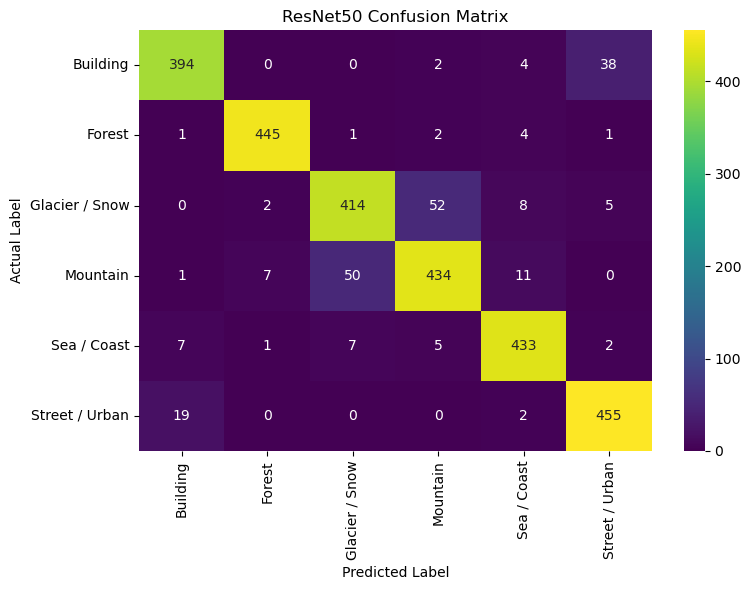

In [99]:
# Generate Confusion Matrix for ResNet50
from sklearn.metrics import confusion_matrix
import seaborn as sns

resnet_cm = confusion_matrix(
    y_test,
    resnet_pred
)

# Plot Confusion Matrix
plt.figure(figsize=(8, 6))

sns.heatmap(
    resnet_cm,
    annot=True,
    fmt="d",
    cmap="viridis",
    xticklabels=class_names,
    yticklabels=class_names
)

plt.title("ResNet50 Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.tight_layout()
plt.show()

### Insights

- ResNet50 achieved **91.73% test accuracy** with strong classification performance across all six categories.
- **Forest** was classified most accurately, with **445 of 454 images** correctly predicted.
- The main misclassification occurred between **Glacier / Snow and Mountain**, with **52 Glacier / Snow images** predicted as Mountain and **50 Mountain images** predicted as Glacier / Snow.
- **Building** also showed some confusion with **Street / Urban**, with **38 Building images** predicted as Street / Urban.
- **Street / Urban** was also classified well, with **455 of 476 images** correctly predicted.

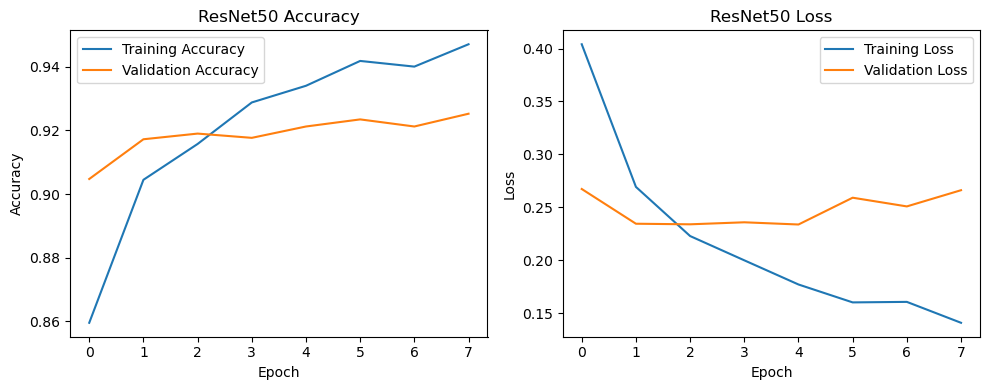

In [101]:
# Plot ResNet50 Learning Curves

plt.figure(figsize=(10, 4))

# Plot Training and Validation Accuracy
plt.subplot(1, 2, 1)
plt.plot(resnet_history.history["accuracy"], label="Training Accuracy")
plt.plot(resnet_history.history["val_accuracy"], label="Validation Accuracy")
plt.title("ResNet50 Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()

# Plot Training and Validation Loss
plt.subplot(1, 2, 2)
plt.plot(resnet_history.history["loss"], label="Training Loss")
plt.plot(resnet_history.history["val_loss"], label="Validation Loss")
plt.title("ResNet50 Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

# Adjust Layout
plt.tight_layout()

# Display Learning Curves
plt.show()

### Insights

- ResNet50 showed a steady improvement in **training accuracy**, reaching approximately **94.7%** by the final epoch.
- **Validation accuracy** improved initially and remained around **92%**, reaching a maximum of approximately **92.5%**.
- **Training loss** consistently decreased throughout the epochs, indicating continued learning from the training data.
- **Validation loss** reached its lowest point around **Epoch 5** and increased afterward, indicating the beginning of **overfitting**.
- The learning curves support using the **best validation-loss checkpoint** rather than the final training epoch.

## Visualize ResNet50 Predictions

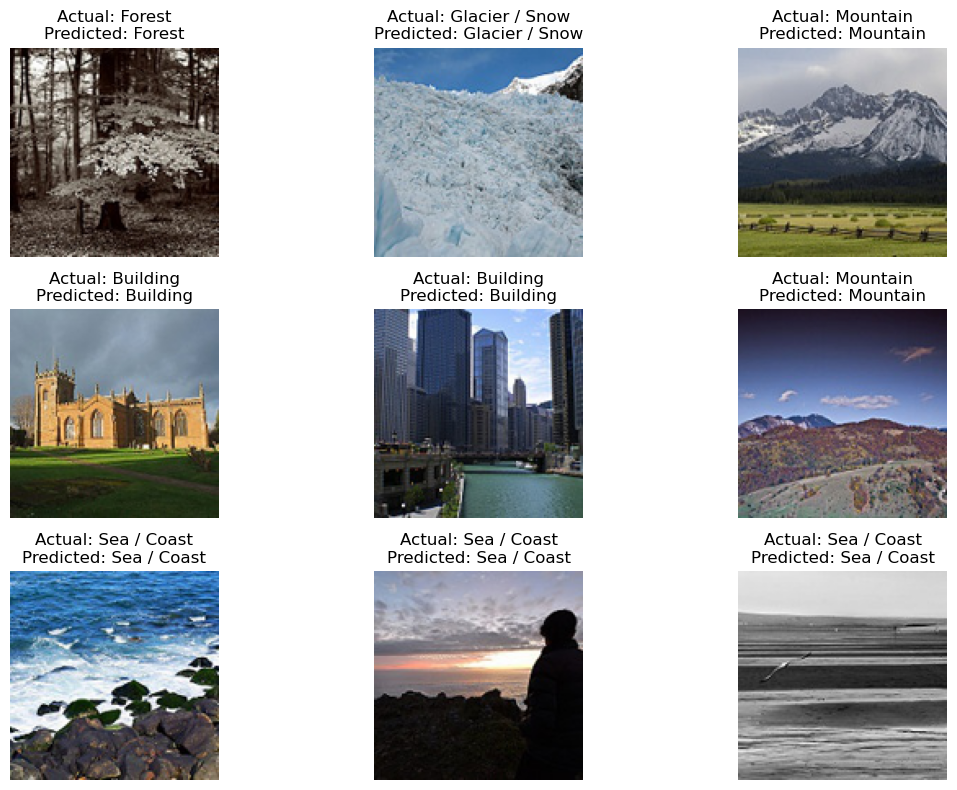

In [105]:
# Visualize ResNet50 Predictions

plt.figure(figsize=(12, 8))

for i in range(9):
    plt.subplot(3, 3, i + 1)

    # Display the original test image
    plt.imshow(X_test[i])

    # Get actual and predicted class names
    actual_label = class_names[y_test[i]]
    predicted_label = class_names[resnet_pred[i]]

    # Display actual and predicted labels
    plt.title(
        f"Actual: {actual_label}\nPredicted: {predicted_label}"
    )

    plt.axis("off")

# Adjust Layout
plt.tight_layout()

# Display Predictions
plt.show()

## Single Image Prediction with Confidence

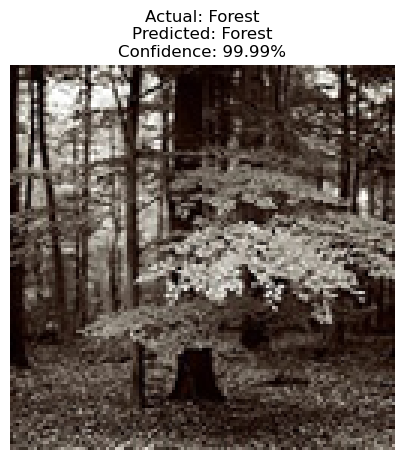

In [106]:
# Single Image Prediction Using ResNet50

# Select a Test Image
image_index = 0

# Get the Image and Actual Label
test_image = X_test[image_index]
actual_label = class_names[y_test[image_index]]

# Prepare Image for ResNet50 Prediction
resnet_image = np.expand_dims(
    X_test_resnet[image_index],
    axis=0
)

# Generate Prediction Probabilities
prediction_prob = best_resnet_model.predict(
    resnet_image,
    verbose=0
)

# Get Predicted Class and Confidence
predicted_class = np.argmax(prediction_prob[0])
confidence = np.max(prediction_prob[0]) * 100

# Display the Image
plt.figure(figsize=(5, 5))
plt.imshow(test_image)
plt.axis("off")

plt.title(
    f"Actual: {actual_label}\n"
    f"Predicted: {class_names[predicted_class]}\n"
    f"Confidence: {confidence:.2f}%"
)

plt.show()

### ResNet50 Conclusion

- ResNet50 effectively leveraged **transfer learning and deep residual feature extraction** to learn meaningful visual patterns for the six-category image classification task.
- The model showed **strong generalization with controlled training**, while validation-based checkpointing ensured that the model with the best validation performance was retained instead of simply using the final training epoch.
- Overall, ResNet50 provides a **robust and reliable deep-learning solution** for this classification problem and serves as a strong candidate for comparison with the other models developed in this project.

# Model Comparison

The performance of all developed models is compared using their **test accuracy** on the unseen test dataset. Since the dataset contains six image categories, test accuracy provides a primary metric for comparing the overall classification performance of the models.

In [107]:
# Model Performance Comparison

model_comparison = pd.DataFrame({
    'Model': [
        'ANN',
        'Basic CNN',
        'Improved CNN',
        'Augmented CNN',
        'MobileNetV2',
        'ResNet50'
    ],
    'Test Accuracy (%)': [
        42.89,
        76.06,
        80.58,
        74.03,
        90.63,
        91.73
    ]
})

model_comparison['Test Accuracy (%)'] = (
    model_comparison['Test Accuracy (%)'].round(2)
)

# Sort Models Based on Test Accuracy

model_comparison = model_comparison.sort_values(
    by='Test Accuracy (%)',
    ascending=False
)

# Reset Index

model_comparison.reset_index(drop=True, inplace=True)

# Display Comparison Table

model_comparison

,Model,Test Accuracy (%)
0,ResNet50,91.73
1,MobileNetV2,90.63
2,Improved CNN,80.58
3,Basic CNN,76.06
4,Augmented CNN,74.03
5,ANN,42.89


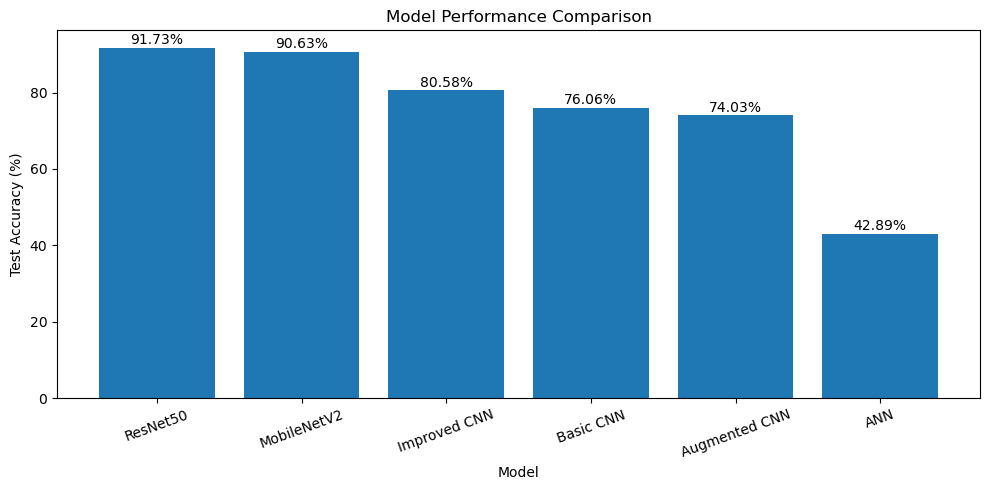

In [108]:
# Model Performance Comparison

plt.figure(figsize=(10, 5))

plt.bar(
    model_comparison["Model"],
    model_comparison["Test Accuracy (%)"]
)

# Add Title and Axis Labels
plt.title("Model Performance Comparison")
plt.xlabel("Model")
plt.ylabel("Test Accuracy (%)")

# Display Accuracy Values
for i, accuracy in enumerate(model_comparison["Test Accuracy (%)"]):
    plt.text(
        i,
        accuracy + 1,
        f"{accuracy:.2f}%",
        ha="center"
    )

# Rotate Model Names for Better Readability
plt.xticks(rotation=20)

# Adjust Layout
plt.tight_layout()

# Display Comparison Plot
plt.show()

## Model Comparison Summary

- The **ResNet50** model achieved the highest test accuracy of **91.73%**, followed by **MobileNetV2** with **90.63%**.
- The **Improved CNN** achieved **80.58%**, showing better performance than the Basic CNN and Augmented CNN models.
- The **Basic CNN** achieved **76.06%**, while the **Augmented CNN** achieved **74.03%**.
- The **ANN** achieved **42.89%**, indicating that CNN-based architectures were more effective for extracting spatial features from images.
- Overall, the results show that **transfer learning models provided the strongest classification performance** for this six-category image classification task.

## Performance Analysis

- **ResNet50 achieved the highest overall performance**, with a test accuracy of **91.73%**. Its deep residual architecture enables the model to learn complex visual and hierarchical features from the six image categories, making it highly suitable for image classification.

- **MobileNetV2 achieved the second-highest performance**, with a test accuracy of **90.63%**. Its transfer learning approach effectively leverages pretrained visual features while using a relatively lightweight architecture.

- **The Improved CNN achieved a test accuracy of 80.58%**, showing an improvement over the Basic CNN at **76.06%**. The improvement indicates that the enhanced CNN architecture provided better feature learning and classification performance.

- **The Augmented CNN achieved a test accuracy of 74.03%**, while the Basic CNN achieved **76.06%**. Although data augmentation introduced greater variation into the training images, it did not result in higher test accuracy for this dataset.

- **The ANN achieved a test accuracy of 42.89%**, which was the lowest among the evaluated models. Since the ANN processes images using flattened pixel values and does not explicitly learn spatial relationships, CNN-based architectures were more effective for this image classification task.

## Final Model Selection

Based on the comparative evaluation, **ResNet50** was selected as the final model for the six-category image classification task.

The model provided the strongest overall performance on the unseen test dataset and demonstrated reliable classification across the six categories.

The confusion matrix further supported the model's effectiveness, with strong predictions for most categories and the main classification challenge occurring between **Glacier / Snow and Mountain**.

**Final Model: ResNet50 (Transfer Learning)**

**Reason for Selection:** Strongest overall test performance and reliable classification across the six image categories.

## Challenges Faced and Techniques Used

| Challenge | Technique Used | Reason |
|---|---|---|
| Understanding the distribution of image categories | Used **class distribution visualization** | Helped understand the number of images available in each of the six categories. |
| Preparing images for deep learning models | Applied **image resizing, RGB conversion, and pixel normalization** | Converted images into a consistent format suitable for deep learning model training. |
| Establishing a baseline deep learning model | Developed an **Artificial Neural Network (ANN)** model | Provided a baseline for evaluating image classification performance. |
| Capturing spatial features from images | Developed a **Convolutional Neural Network (CNN)** | Enabled the model to automatically learn important spatial and visual features from images. |
| Improving CNN classification performance | Developed an **Improved CNN architecture** | Enhanced the baseline CNN architecture to achieve better classification performance. |
| Reducing overfitting and improving generalization | Applied **Data Augmentation** using image transformations | Introduced variations in training images to help the model learn more robust visual patterns. |
| Preserving the best-performing model during training | Used **ModelCheckpoint** | Saved the model with the best validation performance instead of relying only on the final training epoch. |
| Leveraging pre-trained visual features | Applied **Transfer Learning using MobileNetV2 and ResNet50** | Allowed the models to leverage previously learned visual features and adapt them to the six-category classification task. |
| Evaluating multi-class classification performance | Used **Accuracy, Loss, Confusion Matrix, and Classification Report** | Provided an overall and class-wise evaluation of model performance. |
| Selecting the most suitable final model | Compared the performance of **ANN, CNN, and Transfer Learning models** | ResNet50 was selected based on its strongest overall test performance. |
| Interpreting classification errors | Analyzed the **Confusion Matrix and visual predictions** | Helped identify common misclassifications and understand the model's classification behavior across the six categories. |

# Conclusion

The project successfully developed a deep learning-based image classification system to classify images into **six categories: Building, Forest, Glacier / Snow, Mountain, Sea / Coast, and Street / Urban**.

Multiple deep learning architectures were evaluated on the unseen test dataset. Among the evaluated models, **ResNet50 achieved the highest test accuracy of 91.73%** and was selected as the final model.

The results demonstrate the effectiveness of **CNN-based architectures and transfer learning** for multi-class image classification. Overall, the project provides an effective deep learning solution for classifying images across diverse visual categories.